<a href="https://colab.research.google.com/github/sszhang91/CodeShare/blob/main/via_dc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Begin!

## Import packages

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# Filter only rides that started and ended in Manhattan by joining on spatial data
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium

In [3]:
from math import radians, sin, cos, sqrt, atan2

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the distance between two points on the Earth in meters
    using the Haversine formula.

    Args:
        lat1 (float): Latitude of the first point.
        lon1 (float): Longitude of the first point.
        lat2 (float): Latitude of the second point.
        lon2 (float): Longitude of the second point.

    Returns:
        float: Distance between the two points in meters.
    """
    # Radius of the Earth in meters
    R = 6371000

    # Convert degrees to radians
    lat1_rad = radians(lat1)
    lon1_rad = radians(lon1)
    lat2_rad = radians(lat2)
    lon2_rad = radians(lon2)

    # Difference in coordinates
    dlon = lon2_rad - lon1_rad
    dlat = lat2_rad - lat1_rad

    # Haversine formula
    a = sin(dlat / 2)**2 + cos(lat1_rad) * cos(lat2_rad) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance = R * c
    return distance

## Load in files

In [4]:
# # load in the data from the csv

# first_week_df=pd.read_csv('Data_Sources/first_week_df.csv')
# first_week_df.info()

In [5]:
# Loading in from google drive instead for the final filtered one
rides_df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/colab data/first_week_manhattan_filtered.csv')


In [6]:
#load in borough map data

boroughsfile = "/content/drive/MyDrive/Colab Notebooks/colab data/nybb_25c/nybb_25c"
boroughs=gpd.read_file(boroughsfile)
boroughs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BoroCode    5 non-null      int32   
 1   BoroName    5 non-null      object  
 2   Shape_Leng  5 non-null      float64 
 3   Shape_Area  5 non-null      float64 
 4   geometry    5 non-null      geometry
dtypes: float64(2), geometry(1), int32(1), object(1)
memory usage: 312.0+ bytes


In [7]:
boroughs_latlon=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/colab data/nyc_boundaries.json")

In [8]:
# Also load in some more granular map data
zipcode_shp=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/colab data/Modified Zip Code Tabulation Areas (MODZCTA)_20251024")
zipcode_shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   modzcta   178 non-null    object  
 1   label     177 non-null    object  
 2   zcta      178 non-null    object  
 3   pop_est   178 non-null    float64 
 4   geometry  178 non-null    geometry
dtypes: float64(1), geometry(1), object(3)
memory usage: 7.1+ KB


In [9]:
neighbourhood_shp=gpd.read_file("/content/drive/MyDrive/Colab Notebooks/colab data/2020 Neighborhood Tabulation Areas (NTAs)_20251024")
neighbourhood_shp.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 262 entries, 0 to 261
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   borocode    262 non-null    float64 
 1   boroname    262 non-null    object  
 2   countyfips  262 non-null    object  
 3   nta2020     262 non-null    object  
 4   ntaname     262 non-null    object  
 5   ntaabbrev   262 non-null    object  
 6   ntatype     262 non-null    object  
 7   cdta2020    262 non-null    object  
 8   cdtaname    262 non-null    object  
 9   shape_leng  262 non-null    float64 
 10  shape_area  262 non-null    float64 
 11  geometry    262 non-null    geometry
dtypes: float64(3), geometry(1), object(8)
memory usage: 24.7+ KB


In [12]:
# add neighbourhood and zipcode data by spatial join to file. after this, we can just load in that file.
# DO NOT RUN AGAIN
# Perform spatial join between rides_df and neighbourhood_shp for pickup locations
rides_gpd_pickup = gpd.GeoDataFrame(rides_df, geometry=gpd.points_from_xy(rides_df.pickup_longitude, rides_df.pickup_latitude))
#rides_gpd_pickup=rides_gpd_pickup.head(50)
rides_gpd_pickup = rides_gpd_pickup.set_crs("EPSG:4326")
neighbourhood_shp = neighbourhood_shp.to_crs("EPSG:4326")
zipcode_shp = zipcode_shp.to_crs("EPSG:4326")

rides_with_pickup_neighbourhood = gpd.sjoin(rides_gpd_pickup, neighbourhood_shp[['ntaname', 'geometry']],
                                            how="left", lsuffix='_pickup', rsuffix='_neighbourhood_pickup')

# Perform spatial join between rides_df and neighbourhood_shp for dropoff locations
rides_gpd_dropoff = gpd.GeoDataFrame(rides_df, geometry=gpd.points_from_xy(rides_df.dropoff_longitude, rides_df.dropoff_latitude))
#rides_gpd_dropoff = rides_gpd_dropoff.head(50)
rides_gpd_dropoff = rides_gpd_dropoff.set_crs("EPSG:4326")

rides_with_dropoff_neighbourhood = gpd.sjoin(rides_gpd_dropoff, neighbourhood_shp[['ntaname', 'geometry']],
                                             how="left", lsuffix='_dropoff', rsuffix='_neighbourhood_dropoff')

# Merge the dropoff neighbourhood names into the pickup dataframe
rides_with_neighbourhood = rides_with_pickup_neighbourhood.merge(
    rides_with_dropoff_neighbourhood[['ntaname']], left_index=True, right_index=True,suffixes=('_pickup', '_dropoff'))


# Perform spatial join with zipcode_shp for pickup locations
zipcode_noCP = zipcode_shp[zipcode_shp['modzcta'] != '99999'] #remove 99999 central park
rides_with_pickup_zipcode = gpd.sjoin_nearest(rides_gpd_pickup, zipcode_noCP[['modzcta', 'geometry']],
                                              how="left")


# Perform spatial join with zipcode_shp for dropoff locations
rides_with_dropoff_zipcode = gpd.sjoin_nearest(rides_gpd_dropoff, zipcode_noCP[['modzcta', 'geometry']],
                                               how="left", lsuffix='_dropoff', rsuffix='_zipcode_dropoff')


# Merge the zipcode columns into the rides_with_neighbourhood dataframe
rides_with_neighbourhood = rides_with_neighbourhood.merge(
    rides_with_pickup_zipcode[['modzcta']], left_index=True, right_index=True)

rides_with_neighbourhood = rides_with_neighbourhood.merge(
    rides_with_dropoff_zipcode[['modzcta']], left_index=True, right_index=True,suffixes=('_pickup', '_dropoff'))


# Keep original columns from rides_df and the new neighbourhood and zipcode columns
original_cols = list(rides_df.columns)
cols_to_keep = original_cols + ['ntaname_pickup', 'ntaname_dropoff', 'modzcta_pickup', 'modzcta_dropoff']
rides_with_neighbourhood = rides_with_neighbourhood[cols_to_keep]


# Display the first few rows to verify the join
display(rides_with_neighbourhood.head())

rides_with_neighbourhood.to_csv('/content/drive/MyDrive/Colab Notebooks/colab data/manhattan_area_labelled_real.csv',index=False)

/usr/local/lib/python3.12/dist-packages/geopandas/array.py:408: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(
/usr/local/lib/python3.12/dist-packages/geopandas/array.py:408: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,ntaname_pickup,ntaname_dropoff,modzcta_pickup,modzcta_dropoff
0,2013-06-03 00:02:12,2013-06-03 00:10:07,-73.981583,40.773529,-73.981827,40.782124,474,1.3,7.5,7.900000,Upper West Side-Lincoln Square,Upper West Side (Central),10023,10023
1,2013-06-03 00:04:53,2013-06-03 00:10:46,-73.964905,40.806881,-73.962349,40.794987,353,1.1,6.5,5.883333,Morningside Heights,Upper West Side-Manhattan Valley,10025,10025
2,2013-06-03 00:02:50,2013-06-03 00:10:53,-73.993217,40.752106,-73.978149,40.741737,483,1.2,7.5,8.050000,Midtown-Times Square,Murray Hill-Kips Bay,10001,10016
3,2013-06-03 00:04:15,2013-06-03 00:14:31,-73.988441,40.721733,-73.972900,40.755669,616,2.9,11.0,10.266667,Lower East Side,East Midtown-Turtle Bay,10002,10017
4,2013-06-03 00:08:29,2013-06-03 00:17:29,-73.981560,40.732746,-73.981560,40.732746,540,1.8,9.0,9.000000,Gramercy,Gramercy,10003,10003


In [ ]:
# RUN THIS CELL INSTEAD
rides_df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/colab data/manhattan_area_labelled_real.csv')

In [13]:
#rides_df=rides_with_neighbourhood.copy() #add in the other things here
# convert date time columns to datetime format
rides_df['pickup_datetime']=pd.to_datetime(rides_df['pickup_datetime'])
rides_df['dropoff_datetime']=pd.to_datetime(rides_df['dropoff_datetime'])

# derive time features
rides_df['pickup_hour'] = rides_df['pickup_datetime'].dt.hour
rides_df['pickup_weekday'] = rides_df['pickup_datetime'].dt.day_name()

#add a column so that it's encoded as a float with digits of [day][hour][minute] where day is 1-7, hour is 0-23, minute is 0-60
#offset weekday as 1, as by default monday is 0 instead
rides_df['pickup_numeric']=(rides_df['pickup_datetime'].dt.weekday+1)*10000+rides_df['pickup_hour']*100+rides_df['pickup_datetime'].dt.minute

rides_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2809635 entries, 0 to 2809596
Data columns (total 17 columns):
 #   Column             Dtype         
---  ------             -----         
 0   pickup_datetime    datetime64[ns]
 1   dropoff_datetime   datetime64[ns]
 2   pickup_longitude   float64       
 3   pickup_latitude    float64       
 4   dropoff_longitude  float64       
 5   dropoff_latitude   float64       
 6   trip_time_in_secs  int64         
 7   trip_distance      float64       
 8   fare_amount        float64       
 9   trip_time_in_mins  float64       
 10  ntaname_pickup     object        
 11  ntaname_dropoff    object        
 12  modzcta_pickup     object        
 13  modzcta_dropoff    object        
 14  pickup_hour        int32         
 15  pickup_weekday     object        
 16  pickup_numeric     int64         
dtypes: datetime64[ns](2), float64(7), int32(1), int64(2), object(5)
memory usage: 375.1+ MB


## Match borough


Some notes: counting taxi trips in all 5 boroughs in the first full week of June is approximately 3.4 million. Out of these, approximately 400k originated outside of Manhattan. Of the approximate 3 million trips that originate within Manhattan, about 200k end outside of Manhattan, leaving 2.8 million rides that start and end within the borough of Manhattan in the first week of June 2013. The majority of those departing Manhattan to another borough is to Queens - likely to the airports. We could also check this with the fare rate code, but we would not include these either way because trips to/from airports include luggage, and luggage is often a reason riders want to go door to door.

Using these numbers as a sanity check, they are sensible for only rides within Manhattan.

### Clean up data further
Check rate codes:
- Rate Code 1 is standard city fare
- Rate Code 2 is for trips between Manhattan and JFK Airport
- Rate Code 3 are trips to Newark-Liberty International Airport
- Rate Code 4 is for trips to the Counties of Westchester and Nassau
- Rate Code 5 is for trips on an agreed flat fare that go beyond NYC


In [56]:
# Compare rate codes to ensure all are within the city
manhattan_df.rate_code.value_counts()

NameError: name 'manhattan_df' is not defined

In [ ]:
manhattan_df[manhattan_df['rate_code']==6]
# The rate codes conflict with pickup and dropoff locations, we will drop these and only keep rate code 1

In [ ]:
# Only keep rate code 1
manhattan_df=manhattan_df[manhattan_df['rate_code']==1]
manhattan_df.rate_code.value_counts()

In [ ]:
# Only keep columns that we need, and drop all others. We will keep pickup and dropoff place and time, trip time, trip distance,
# and fare amount only. We will exclude surharges, taxes, tips, and tolls as we are only interested in efficiency of ride aggregation
# we will use the index as a trip ID
manhattan_df.info()
filtered_df=manhattan_df[['pickup_datetime','dropoff_datetime','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','trip_time_in_secs','trip_distance','fare_amount']]

In [ ]:
filtered_df.info()
# convert date time columns to datetime format
filtered_df['pickup_datetime']=pd.to_datetime(filtered_df['pickup_datetime'])
filtered_df['dropoff_datetime']=pd.to_datetime(filtered_df['dropoff_datetime'])

In [ ]:
filtered_df.describe()

# the pickup dates and times fall within the expected date range


In [ ]:
# look at ones where trip time and distance is zero
#filtered_df[(filtered_df['trip_time_in_secs']==0)]
filtered_df[(filtered_df['trip_distance']==0)]

In [ ]:
# Since we have a lot of data points, and the ones with zero distance or time could either be errors
# or 'trips' that were cancelled immediately, and there are not too many of them, we will drop these rows
filtered_df=filtered_df[(filtered_df['trip_distance']>0) & (filtered_df['trip_time_in_secs']>0)]
filtered_df.describe()

In [ ]:
# for human readability, convert trip time from seconds to minutes
filtered_df['trip_time_in_mins']=filtered_df['trip_time_in_secs']/60
filtered_df.describe()

In [ ]:
# save this further filtered data to a csv
filtered_df.to_csv('Data_Sources\\first_week_manhattan_filtered.csv',index=False)

In [ ]:
#read in the file from the zipped file
boroughs=gpd.read_file("Data_Sources\\nybb_25c")
boroughs.info()

#we will possibly clean this up later and add a function so we can also filter for other boroughs


In [ ]:

# assign borough to pick up coordinates
trip_copy_df=first_week_df.copy()
trip_copy_df['geometry']=gpd.points_from_xy(trip_copy_df['pickup_longitude'], trip_copy_df['pickup_latitude'],crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(data=trip_copy_df, geometry='geometry')

#convert it to the same projection as the boroughs one and then spatial join
df_gpd=df_gpd.to_crs(boroughs.crs)
#df_gpd.head(5)
joined_df = df_gpd.sjoin(boroughs, how="left")

#joined_df.head()
#drop anything that is not in Manhattan
manhattan_df=pd.DataFrame(joined_df[joined_df['BoroName']=='Manhattan'])

# keep original dataframe columns plus BoroName, drop other spatial join columns
original_cols = list(first_week_df.columns)
cols_to_keep = [c for c in original_cols + ['BoroName'] if c in manhattan_df.columns]
manhattan_df = manhattan_df[cols_to_keep].copy()


In [ ]:


#also go through and check for drop off points being in manhattan
# convert the dataframe to one with geometry in the same projection as the boroughs file
trip_copy_df=manhattan_df.copy()
trip_copy_df['geometry']=gpd.points_from_xy(trip_copy_df['dropoff_longitude'], trip_copy_df['dropoff_latitude'],crs="EPSG:4326")
df_gpd=gpd.GeoDataFrame(data=trip_copy_df, geometry='geometry')

#convert it to the same projection as the boroughs one
df_gpd=df_gpd.to_crs(boroughs.crs)


#spatial join on the dropoff points now
joined_df = df_gpd.sjoin(boroughs, how="left",lsuffix='pickup', rsuffix='dropoff')
joined_df=joined_df.drop(columns=['geometry','index_dropoff','BoroCode','Shape_Leng','Shape_Area'])
joined_df.info()
#only keep entries which have drop off also as manhattan
manhattan_df=joined_df[joined_df['BoroName_dropoff']=='Manhattan']
#check that now it's only manhattan for both pickup and dropoff
print('dropoff:',manhattan_df['BoroName_dropoff'].value_counts(dropna=False),'pickup:',manhattan_df['BoroName_pickup'].value_counts(dropna=False))

In [ ]:
#save this to a csv as our data, reset index
manhattan_df.reset_index(drop=True,inplace=True)
manhattan_df.to_csv('Data_Sources\\first_week_manhattan_only.csv',index=False)

### Add spatial zoning data

In [22]:
# df is 'rides_df'
# we have zipcode_shp and neighbourhood_shp
#
neighbourhood_shp.head()
#zipcode_shp.head()

,borocode,boroname,countyfips,nta2020,ntaname,ntaabbrev,ntatype,cdta2020,cdtaname,shape_leng,shape_area,geometry
0,3.0,Brooklyn,047,BK0101,Greenpoint,Grnpt,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),28919.560816,3.532181e+07,"POLYGON ((-73.93213 40.72816, -73.93238 40.727..."
1,3.0,Brooklyn,047,BK0102,Williamsburg,Wllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),28134.082316,2.885285e+07,"POLYGON ((-73.95814 40.7244, -73.95772 40.7242..."
2,3.0,Brooklyn,047,BK0103,South Williamsburg,SWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),18250.280316,1.520896e+07,"POLYGON ((-73.95024 40.70547, -73.94984 40.705..."
3,3.0,Brooklyn,047,BK0104,East Williamsburg,EWllmsbrg,0,BK01,BK01 Williamsburg-Greenpoint (CD 1 Equivalent),43184.798703,5.226741e+07,"POLYGON ((-73.92406 40.71411, -73.92404 40.714..."
4,3.0,Brooklyn,047,BK0201,Brooklyn Heights,BkHts,0,BK02,BK02 Downtown Brooklyn-Fort Greene (CD 2 Appro...,14312.192068,9.982023e+06,"POLYGON ((-73.99236 40.68969, -73.99436 40.690..."


In [120]:
# Perform spatial join between rides_df and neighbourhood_shp for pickup locations
rides_gpd_pickup = gpd.GeoDataFrame(rides_df, geometry=gpd.points_from_xy(rides_df.pickup_longitude, rides_df.pickup_latitude))
rides_gpd_pickup=rides_gpd_pickup.head(50)
rides_gpd_pickup = rides_gpd_pickup.set_crs("EPSG:4326")
neighbourhood_shp = neighbourhood_shp.to_crs("EPSG:4326")
zipcode_shp = zipcode_shp.to_crs("EPSG:4326")

rides_with_pickup_neighbourhood = gpd.sjoin(rides_gpd_pickup, neighbourhood_shp[['ntaname', 'geometry']],
                                            how="left", lsuffix='_pickup', rsuffix='_neighbourhood_pickup')

# Perform spatial join between rides_df and neighbourhood_shp for dropoff locations
rides_gpd_dropoff = gpd.GeoDataFrame(rides_df, geometry=gpd.points_from_xy(rides_df.dropoff_longitude, rides_df.dropoff_latitude))
rides_gpd_dropoff = rides_gpd_dropoff.head(50)
rides_gpd_dropoff = rides_gpd_dropoff.set_crs("EPSG:4326")

rides_with_dropoff_neighbourhood = gpd.sjoin(rides_gpd_dropoff, neighbourhood_shp[['ntaname', 'geometry']],
                                             how="left", lsuffix='_dropoff', rsuffix='_neighbourhood_dropoff')

# Merge the dropoff neighbourhood names into the pickup dataframe
rides_with_neighbourhood = rides_with_pickup_neighbourhood.merge(
    rides_with_dropoff_neighbourhood[['ntaname']], left_index=True, right_index=True,suffixes=('_pickup', '_dropoff'))


# Perform spatial join with zipcode_shp for pickup locations
zipcode_noCP = zipcode_shp[zipcode_shp['modzcta'] != '99999'] #remove 99999 central park
rides_with_pickup_zipcode = gpd.sjoin_nearest(rides_gpd_pickup, zipcode_noCP[['modzcta', 'geometry']],
                                              how="left")


# Perform spatial join with zipcode_shp for dropoff locations
rides_with_dropoff_zipcode = gpd.sjoin_nearest(rides_gpd_dropoff, zipcode_noCP[['modzcta', 'geometry']],
                                               how="left", lsuffix='_dropoff', rsuffix='_zipcode_dropoff')


# Merge the zipcode columns into the rides_with_neighbourhood dataframe
rides_with_neighbourhood = rides_with_neighbourhood.merge(
    rides_with_pickup_zipcode[['modzcta']], left_index=True, right_index=True)

rides_with_neighbourhood = rides_with_neighbourhood.merge(
    rides_with_dropoff_zipcode[['modzcta']], left_index=True, right_index=True,suffixes=('_pickup', '_dropoff'))


# Keep original columns from rides_df and the new neighbourhood and zipcode columns
original_cols = list(rides_df.columns)
cols_to_keep = original_cols + ['ntaname_pickup', 'ntaname_dropoff', 'modzcta_pickup', 'modzcta_dropoff']
rides_with_neighbourhood = rides_with_neighbourhood[cols_to_keep]


# Display the first few rows to verify the join
display(rides_with_neighbourhood.head())

KeyError: "None of [Index(['ntaname_neighbourhood_dropoff'], dtype='object')] are in the [columns]"

In [52]:
rides_with_neighbourhood.modzcta.unique()

array(['10023', '10025', '10001', '10002', '10003', '10128', '10021',
       '10036', '10019', '10069', '10017', '10014', '10010', '10006',
       '10016', '10022', '10007', '10065', '10013', '10027', '10026',
       '10011', '10012', '10028', '10009', '10075', '10029', '10018',
       '10024', '10004', '10038', '10280', '10032', '10005', '10282',
       '10031', '10039', '10035', '10037', '10030', '10033', '10044',
       '10040', '10034', '10463', '11201', '11231'], dtype=object)

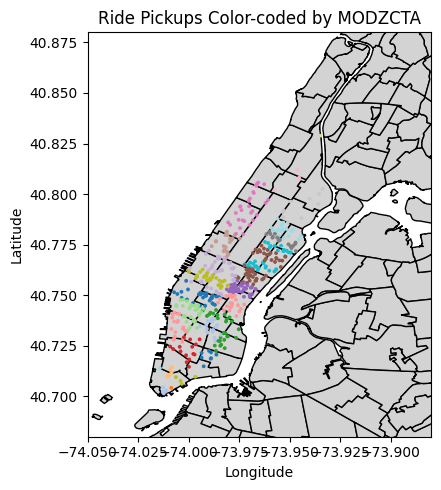

['10017', '10010', '10016', '10038', '10014', ..., '10035', '10005', '10006', '10026', '10039']
Length: 34
Categories (34, object): ['10001', '10002', '10003', '10004', ..., '10065', '10075', '10128', '10282']


In [53]:
# Plot the rides_with_neighbourhood points on the neighbourhood_shp map, color-coded by modzcta
fig, ax = plt.subplots(figsize=(5, 5))

# Plot the neighbourhood boundaries
neighbourhood_shp.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot the ride points, color-coded by 'modzcta'
# Sample the data for faster plotting if needed
#plot_df=rides_with_neighbourhood[rides_with_neighbourhood.modzcta=='99999'] #just look at the central park ones atm
sample_size = 500 # Adjust sample size as needed l
plot_df = rides_with_neighbourhood.sample(n=sample_size, random_state=42) if len(rides_with_neighbourhood) > sample_size else rides_with_neighbourhood.copy()

# Ensure 'modzcta' is treated as a categorical variable for coloring
plot_df['modzcta'] = plot_df['modzcta'].astype('category')

scatter = ax.scatter(plot_df['pickup_longitude'], plot_df['pickup_latitude'],
                     c=plot_df['modzcta'].cat.codes, cmap='tab20', s=3, alpha=1, label='Rides by MODZCTA')

ax.set_title('Ride Pickups Color-coded by MODZCTA')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05, -73.88)
ax.set_ylim(40.68, 40.88)
ax.set_aspect('equal', adjustable='box')

# Create a legend with MODZCTA labels and colors
# This might be too crowded with many MODZCTAs, consider alternative legend
legend_elements = [plt.scatter([], [], marker='o', color=plt.cm.tab20(i/len(plot_df['modzcta'].cat.categories)), label=cat)
                   for i, cat in enumerate(plot_df['modzcta'].cat.categories)]

# Shrink current axis by 20%
box = ax.get_position()
# Put a legend to the right of the current axis
#ax.legend(handles=legend_elements, title="MODZCTA",loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()
print(plot_df.modzcta.unique())

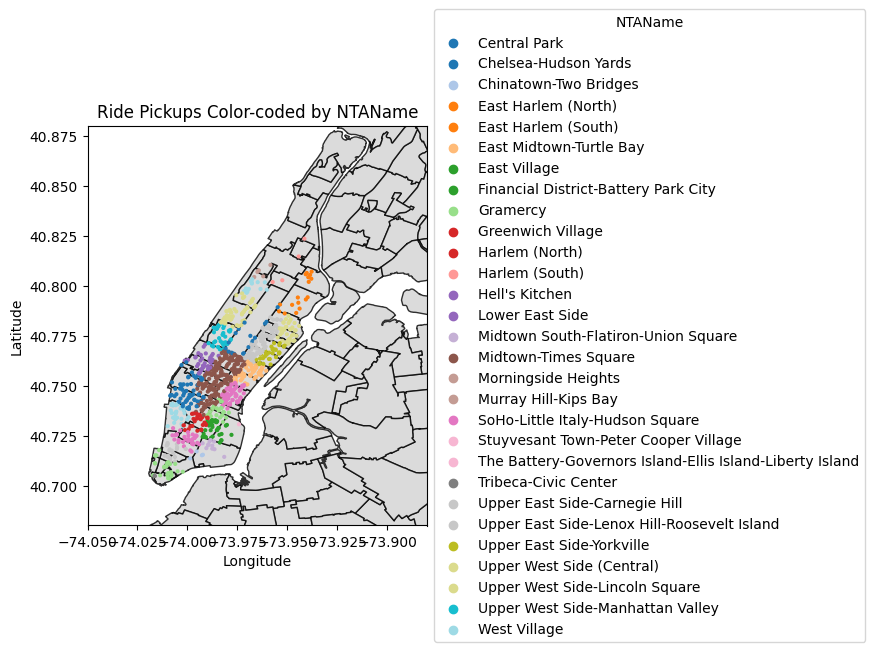

In [57]:
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the zipcode boundaries
zipcode_shp.plot(ax=ax, color='lightgrey', edgecolor='black',alpha=0.8)

# Plot the ride points, color-coded by 'ntaname'
# Sample the data for faster plotting if needed
sample_size = 1000 # Adjust sample size as needed
plot_df = rides_with_neighbourhood.sample(n=sample_size) if len(rides_with_neighbourhood) > sample_size else rides_with_neighbourhood.copy()

# Ensure 'ntaname' is treated as a categorical variable for coloring
plot_df['ntaname_pickup'] = plot_df['ntaname_pickup'].astype('category')

scatter = ax.scatter(plot_df['pickup_longitude'], plot_df['pickup_latitude'],
                     c=plot_df['ntaname_pickup'].cat.codes, cmap='tab20', s=4, alpha=1, label='Rides by NTAName')

ax.set_title('Ride Pickups Color-coded by NTAName')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05, -73.88)
ax.set_ylim(40.68, 40.88)
ax.set_aspect('equal', adjustable='box')

# Add a legend - might be too crowded with many NTANames
legend_elements = [plt.scatter([], [], marker='o', color=plt.cm.tab20(i/len(plot_df['ntaname_pickup'].cat.categories)), label=cat)
                   for i, cat in enumerate(plot_df['ntaname_pickup'].cat.categories)]

# Shrink current axis by 20%
box = ax.get_position()
# Put a legend to the right of the current axis
ax.legend(handles=legend_elements, title="NTAName",loc='center left', bbox_to_anchor=(1, 0.5))

plt.tight_layout()
plt.show()

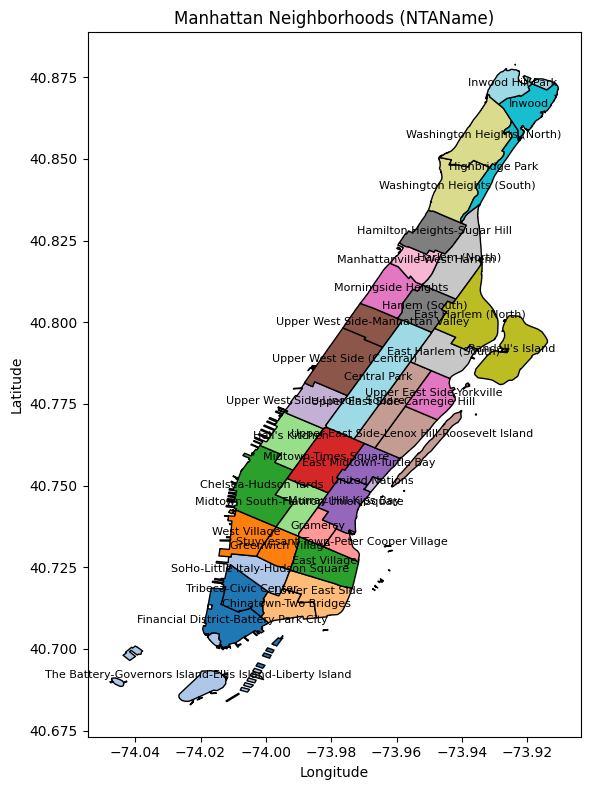

In [61]:
fig, ax = plt.subplots(figsize=(8, 8))
neighbourhood_shp_plt=neighbourhood_shp[neighbourhood_shp['borocode']==1]
# Plot the neighborhood boundaries, color-coded by index
neighbourhood_shp_plt.plot(ax=ax, cmap='tab20', edgecolor='black')

# Add neighborhood names as annotations
for idx, row in neighbourhood_shp_plt.iterrows():
    # Get the centroid of the polygon
    centroid = row.geometry.centroid
    ax.annotate(text=row['ntaname'], xy=(centroid.x, centroid.y),
                horizontalalignment='center', fontsize=8, color='black')

ax.set_title('Manhattan Neighborhoods (NTAName)')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
# Adjust plot limits to focus on Manhattan if needed
# ax.set_xlim(...)
# ax.set_ylim(...)
ax.set_aspect('equal', adjustable='box')
plt.tight_layout()
plt.show()

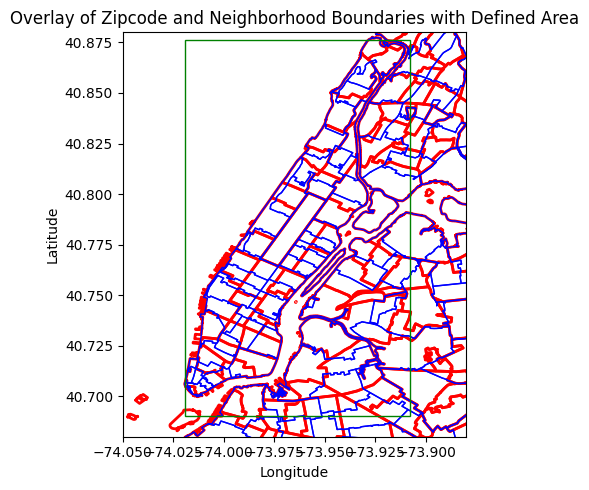

In [60]:
from matplotlib.patches import Rectangle

fig, ax = plt.subplots(figsize=(7, 5))

# Plot the neighbourhood boundaries
neighbourhood_shp.plot(ax=ax, color='none', edgecolor='red', linewidth=2, label='Neighborhood Boundaries')

# Plot the zipcode boundaries
zipcode_shp.plot(ax=ax, color='none', edgecolor='blue', linewidth=1, label='Zipcode Boundaries')

# Define the rectangle coordinates
rect_lon_min, rect_lon_max = -74.019142, -73.908089
rect_lat_min, rect_lat_max = 40.690361, 40.876007

# Create the rectangle patch
rectangle = Rectangle((rect_lon_min, rect_lat_min),
                      rect_lon_max - rect_lon_min,
                      rect_lat_max - rect_lat_min,
                      linewidth=1, edgecolor='green', facecolor='none', label='Defined Area')

# Add the rectangle to the axes
ax.add_patch(rectangle)


ax.set_title('Overlay of Zipcode and Neighborhood Boundaries with Defined Area')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05, -73.88)
ax.set_ylim(40.68, 40.88)
ax.set_aspect('equal', adjustable='box')
#ax.legend()
plt.tight_layout()
plt.show()

In [57]:
#save this joined file
rides_with_neighbourhood.to_csv('/content/drive/MyDrive/Colab Notebooks/colab data/manhattan_rides_area_labelled.csv',index=False)

## Visualisation and EDA

### Add some time features to also look at

In [15]:
rides_df['dist_per_time'] = (rides_df['trip_distance'] /
                                             rides_df['trip_time_in_secs']*60*60).round(4) #in miles per hour
display(rides_df.head())

,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,ntaname_pickup,ntaname_dropoff,modzcta_pickup,modzcta_dropoff,pickup_hour,pickup_weekday,pickup_numeric,dist_per_time
0,2013-06-03 00:02:12,2013-06-03 00:10:07,-73.981583,40.773529,-73.981827,40.782124,474,1.3,7.5,7.900000,Upper West Side-Lincoln Square,Upper West Side (Central),10023,10023,0,Monday,10002,9.8734
1,2013-06-03 00:04:53,2013-06-03 00:10:46,-73.964905,40.806881,-73.962349,40.794987,353,1.1,6.5,5.883333,Morningside Heights,Upper West Side-Manhattan Valley,10025,10025,0,Monday,10004,11.2181
2,2013-06-03 00:02:50,2013-06-03 00:10:53,-73.993217,40.752106,-73.978149,40.741737,483,1.2,7.5,8.050000,Midtown-Times Square,Murray Hill-Kips Bay,10001,10016,0,Monday,10002,8.9441
3,2013-06-03 00:04:15,2013-06-03 00:14:31,-73.988441,40.721733,-73.972900,40.755669,616,2.9,11.0,10.266667,Lower East Side,East Midtown-Turtle Bay,10002,10017,0,Monday,10004,16.9481
4,2013-06-03 00:08:29,2013-06-03 00:17:29,-73.981560,40.732746,-73.981560,40.732746,540,1.8,9.0,9.000000,Gramercy,Gramercy,10003,10003,0,Monday,10008,12.0000


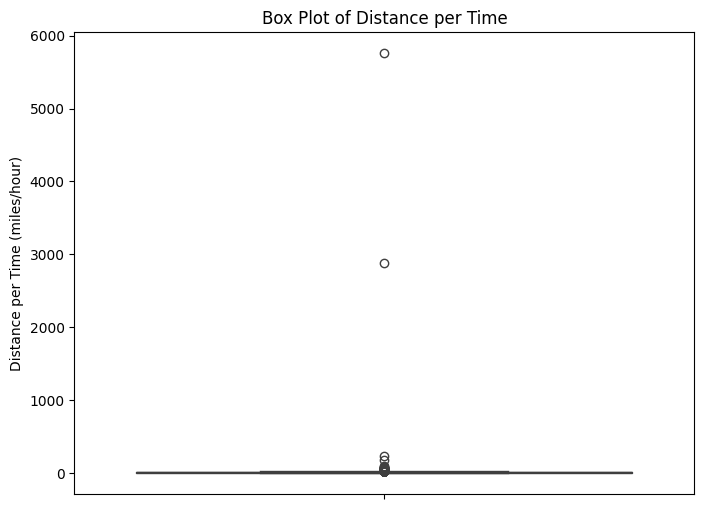

In [21]:
rides_df_plot=rides_df.sample(n=40000, random_state=1) if len(rides_df) > 40000 else rides_df

# take a look at the distribution
plt.figure(figsize=(8, 6))
sns.boxplot(y=rides_df_plot['dist_per_time'])
plt.title('Box Plot of Distance per Time')
plt.ylabel('Distance per Time (miles/hour)')
plt.show()

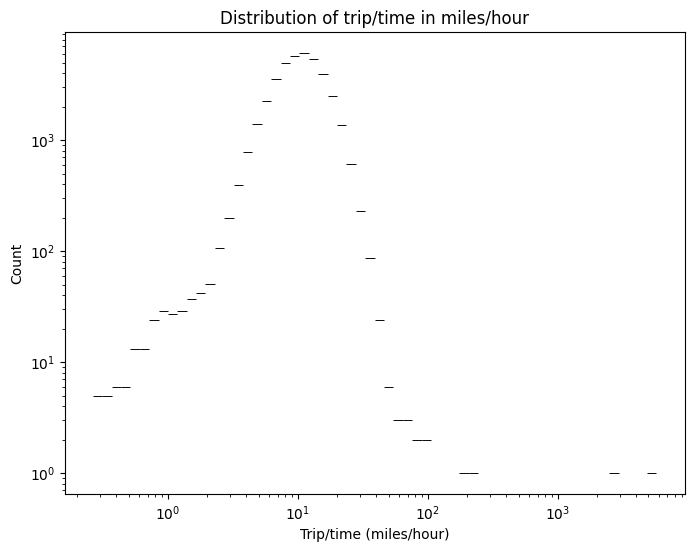

In [22]:
plt.figure(figsize=(8, 6))
ax = sns.histplot(rides_df_plot['dist_per_time'], bins=60,log_scale=(True,True))
ax.set_title('Distribution of trip/time in miles/hour')
ax.set_xlabel('Trip/time (miles/hour)')
plt.show()

In [23]:
# Calculate the 10th and 90th percentiles of 'dist_per_time'
lower_bound = rides_df['dist_per_time'].quantile(0.10)
upper_bound = rides_df['dist_per_time'].quantile(0.90)

# Filter the DataFrame
rides_filtered_percentile = rides_df[
    (rides_df['dist_per_time'] >= lower_bound) &
    (rides_df['dist_per_time'] <= upper_bound)
].copy()

print(f"Original number of rides: {len(rides_df)}")
print(f"Number of rides after filtering: {len(rides_filtered_percentile)}")
print(f"Rides removed: {len(rides_df) - len(rides_filtered_percentile)}")

display(rides_filtered_percentile.head())

Original number of rides: 2809635
Number of rides after filtering: 2247878
Rides removed: 561757


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,ntaname_pickup,ntaname_dropoff,modzcta_pickup,modzcta_dropoff,pickup_hour,pickup_weekday,pickup_numeric,dist_per_time
0,2013-06-03 00:02:12,2013-06-03 00:10:07,-73.981583,40.773529,-73.981827,40.782124,474,1.3,7.5,7.900000,Upper West Side-Lincoln Square,Upper West Side (Central),10023,10023,0,Monday,10002,9.8734
1,2013-06-03 00:04:53,2013-06-03 00:10:46,-73.964905,40.806881,-73.962349,40.794987,353,1.1,6.5,5.883333,Morningside Heights,Upper West Side-Manhattan Valley,10025,10025,0,Monday,10004,11.2181
2,2013-06-03 00:02:50,2013-06-03 00:10:53,-73.993217,40.752106,-73.978149,40.741737,483,1.2,7.5,8.050000,Midtown-Times Square,Murray Hill-Kips Bay,10001,10016,0,Monday,10002,8.9441
3,2013-06-03 00:04:15,2013-06-03 00:14:31,-73.988441,40.721733,-73.972900,40.755669,616,2.9,11.0,10.266667,Lower East Side,East Midtown-Turtle Bay,10002,10017,0,Monday,10004,16.9481
4,2013-06-03 00:08:29,2013-06-03 00:17:29,-73.981560,40.732746,-73.981560,40.732746,540,1.8,9.0,9.000000,Gramercy,Gramercy,10003,10003,0,Monday,10008,12.0000


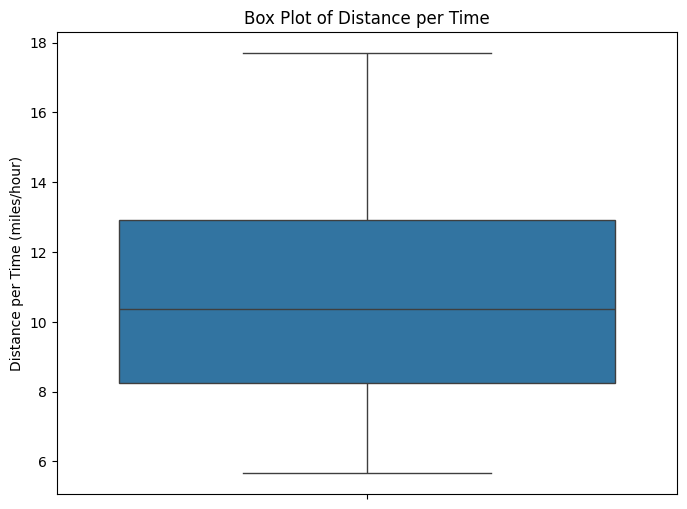

In [24]:
rides_filtered_plot=rides_filtered_percentile.sample(n=40000, random_state=1) if len(rides_filtered_percentile) > 40000 else rides_filtered_percentile

# take a look at the distribution
plt.figure(figsize=(8, 6))
sns.boxplot(y=rides_filtered_plot['dist_per_time'])
plt.title('Box Plot of Distance per Time')
plt.ylabel('Distance per Time (miles/hour)')
plt.show()

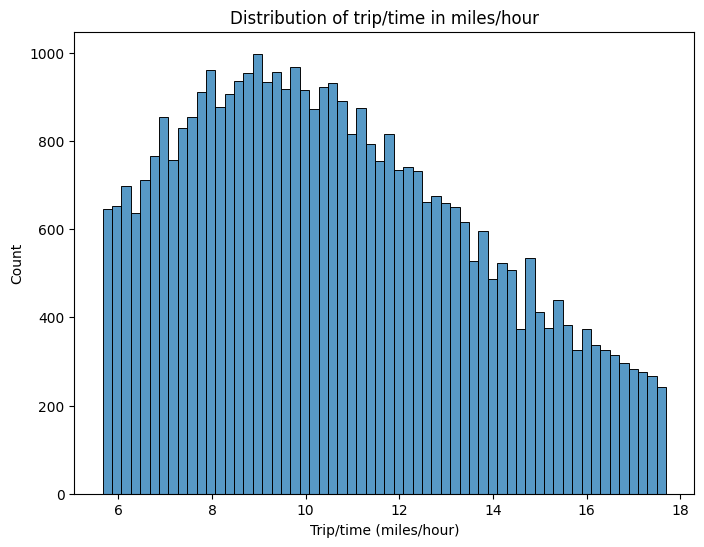

In [25]:
plt.figure(figsize=(8, 6))
ax = sns.histplot(rides_filtered_plot['dist_per_time'], bins=60)
ax.set_title('Distribution of trip/time in miles/hour')
ax.set_xlabel('Trip/time (miles/hour)')
plt.show()

### Visualisation

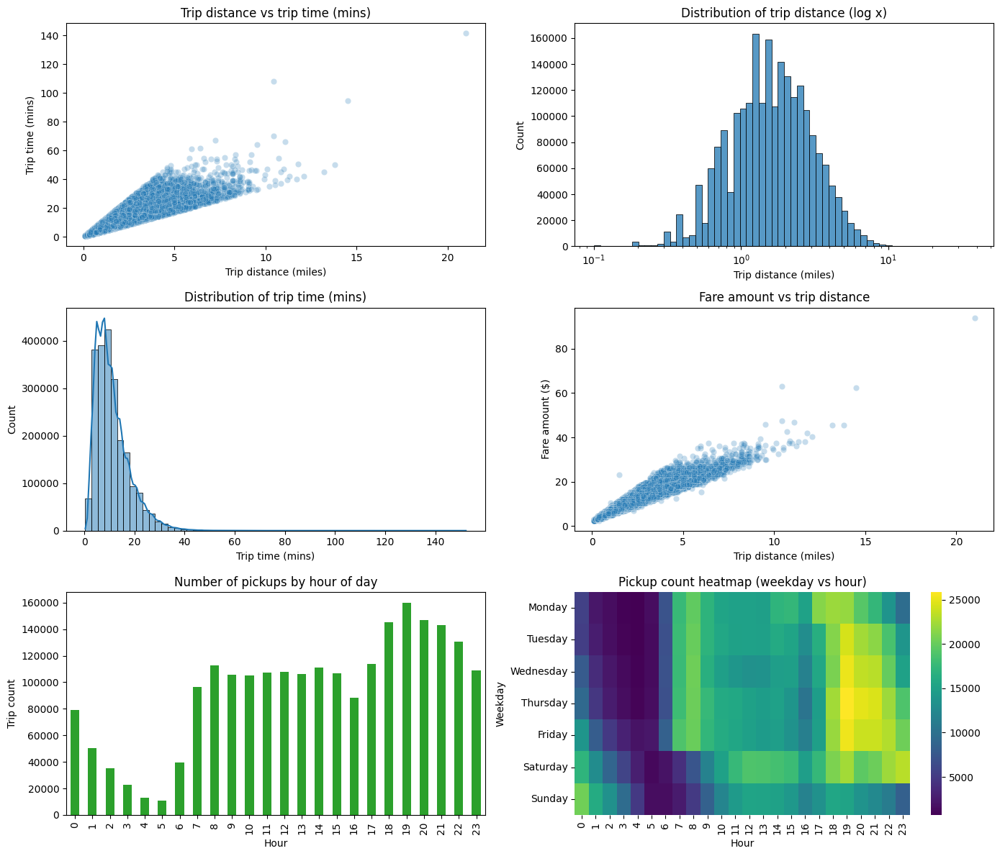

In [28]:
# Visualisations for filtered_df (new cell at index 21)
# relies on plt and sns being available in the notebook (they are imported in a later cell)
sample_size=40000
sample_df=rides_filtered_percentile.sample(n=sample_size, random_state=1) if len(rides_filtered_percentile) > 40000 else rides_filtered_percentile



fig, axes = plt.subplots(3, 2, figsize=(14,12))

# 1) Distance vs time
sns.scatterplot(data=sample_df, x='trip_distance', y='trip_time_in_mins', alpha=0.25, ax=axes[0,0])
axes[0,0].set_title('Trip distance vs trip time (mins)')
axes[0,0].set_xlabel('Trip distance (miles)')
axes[0,0].set_ylabel('Trip time (mins)')

# 2) Distance distribution (log x for readability)
sns.histplot(rides_filtered_percentile['trip_distance'], bins=60, ax=axes[0,1], log_scale=(True, False))
axes[0,1].set_title('Distribution of trip distance (log x)')
axes[0,1].set_xlabel('Trip distance (miles)')

# 3) Trip time distribution
sns.histplot(rides_filtered_percentile['trip_time_in_mins'], bins=60, ax=axes[1,0], kde=True)
axes[1,0].set_title('Distribution of trip time (mins)')
axes[1,0].set_xlabel('Trip time (mins)')

# 4) Fare vs distance
sns.scatterplot(data=sample_df, x='trip_distance', y='fare_amount', alpha=0.25, ax=axes[1,1])
axes[1,1].set_title('Fare amount vs trip distance')
axes[1,1].set_xlabel('Trip distance (miles)')
axes[1,1].set_ylabel('Fare amount ($)')

# 5) Trips by pickup hour
hour_counts = rides_filtered_percentile['pickup_hour'].value_counts().sort_index()
hour_counts.plot(kind='bar', ax=axes[2,0], color='C2')
axes[2,0].set_title('Number of pickups by hour of day')
axes[2,0].set_xlabel('Hour')
axes[2,0].set_ylabel('Trip count')

# 6) Heatmap: weekday vs hour (counts)
pivot = (
    rides_filtered_percentile
    .pivot_table(index='pickup_weekday', columns='pickup_hour', values='trip_distance', aggfunc='count')
    .reindex(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
)
sns.heatmap(pivot.fillna(0), cmap='viridis', ax=axes[2,1])
axes[2,1].set_title('Pickup count heatmap (weekday vs hour)')
axes[2,1].set_xlabel('Hour')
axes[2,1].set_ylabel('Weekday')

plt.tight_layout()

In [34]:
# Calculate the number of pickups per neighborhood
pickup_counts = rides_filtered_percentile['ntaname_pickup'].value_counts()

# Display the pickup counts
print("Number of pickups by neighborhood:")
display(pickup_counts)

Number of pickups by neighborhood:


,count
ntaname_pickup,
Midtown-Times Square,285115
Midtown South-Flatiron-Union Square,197026
Upper East Side-Carnegie Hill,186133
Chelsea-Hudson Yards,151811
East Midtown-Turtle Bay,138309
Murray Hill-Kips Bay,110414
Upper West Side (Central),110068
Upper West Side-Lincoln Square,102493
Hell's Kitchen,100086


In [35]:
# 1. Identify Top Neighborhoods
top_10_neighborhoods = pickup_counts.head(10).index.tolist()
print("Top 10 neighborhoods by pickup count:", top_10_neighborhoods)

Top 10 neighborhoods by pickup count: ['Midtown-Times Square', 'Midtown South-Flatiron-Union Square', 'Upper East Side-Carnegie Hill', 'Chelsea-Hudson Yards', 'East Midtown-Turtle Bay', 'Murray Hill-Kips Bay', 'Upper West Side (Central)', 'Upper West Side-Lincoln Square', "Hell's Kitchen", 'Upper East Side-Lenox Hill-Roosevelt Island']


In [36]:
# 2. Filter Data
rides_top_10_neighborhoods = rides_filtered_percentile[
    rides_filtered_percentile['ntaname_pickup'].isin(top_10_neighborhoods)
].copy()

print(f"\nNumber of rides in the top 10 neighborhoods: {len(rides_top_10_neighborhoods)}")


Number of rides in the top 10 neighborhoods: 1479920


/tmp/ipython-input-3813952864.py:22: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-3813952864.py:22: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-3813952864.py:22: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-3813952864.py:22: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specif

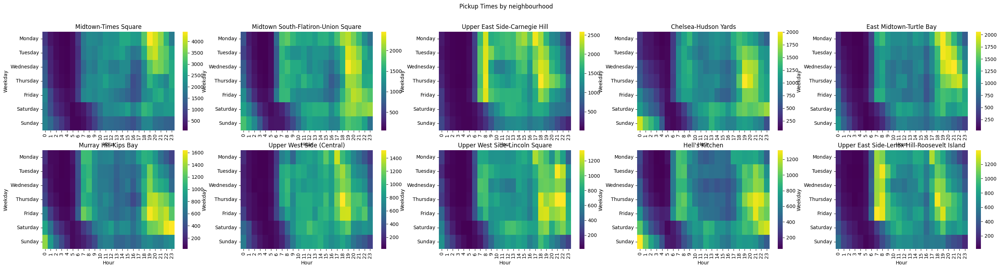

In [51]:
fig, axes = plt.subplots(2,5, figsize=(35,8))
axes=axes.flatten()
fig.suptitle('Pickup Times by neighbourhood')
# Ensure 'pickup_weekday' is ordered correctly
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
rides_top_10_neighborhoods['pickup_weekday'] = pd.Categorical(
    rides_top_10_neighborhoods['pickup_weekday'], categories=weekday_order, ordered=True
)


for i, neighborhood in enumerate(top_10_neighborhoods):
    df_neighborhood = rides_top_10_neighborhoods[
        rides_top_10_neighborhoods['ntaname_pickup'] == neighborhood
    ].copy()
    #print(i)
    ax1=axes[i]
    #ax1.set_title(f"Subplot {i+1}")

    if not df_neighborhood.empty:
        # Create pivot table for pickup counts
        pickup_pivot = (
            df_neighborhood.pivot_table(
            index='pickup_weekday', columns='pickup_hour', values='trip_distance', aggfunc='count'
        ).reindex(weekday_order)
        )
        # Plot heatmap on the correct axis


        sns.heatmap(pickup_pivot.fillna(0),ax=ax1, cmap='viridis')
        ax1.set_title(f'{neighborhood}')
        ax1.set_xlabel('Hour')
        ax1.set_ylabel('Weekday')

    else:
        print(f"No data for pickup heatmap in {neighborhood}")
plt.show()

/tmp/ipython-input-2681338391.py:27: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-2681338391.py:27: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-2681338391.py:27: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  df_neighborhood.pivot_table(
/tmp/ipython-input-2681338391.py:27: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specif

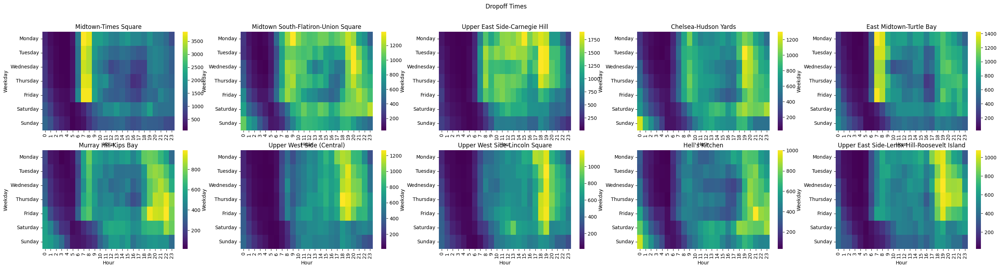

In [50]:
#same thing for drop off times
# derive time features
rides_top_10_neighborhoods['dropoff_hour'] = rides_top_10_neighborhoods['dropoff_datetime'].dt.hour
rides_top_10_neighborhoods['dropoff_weekday'] = rides_top_10_neighborhoods['dropoff_datetime'].dt.day_name()

fig, axes = plt.subplots(2,5, figsize=(35,8))
axes=axes.flatten()
fig.suptitle('Dropoff Times')
# Ensure 'dropoff_weekday' is ordered correctly
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
rides_top_10_neighborhoods['dropoff_weekday'] = pd.Categorical(
    rides_top_10_neighborhoods['dropoff_weekday'], categories=weekday_order, ordered=True
)


for i, neighborhood in enumerate(top_10_neighborhoods):
    df_neighborhood = rides_top_10_neighborhoods[
        rides_top_10_neighborhoods['ntaname_dropoff'] == neighborhood
    ].copy()
    #print(i)
    ax1=axes[i]
    #ax1.set_title(f"Subplot {i+1}")

    if not df_neighborhood.empty:
        # Create pivot table for dropoff counts
        dropoff_pivot = (
            df_neighborhood.pivot_table(
            index='dropoff_weekday', columns='dropoff_hour', values='trip_distance', aggfunc='count'
        ).reindex(weekday_order)
        )
        # Plot heatmap on the correct axis


        sns.heatmap(dropoff_pivot.fillna(0),ax=ax1, cmap='viridis')
        ax1.set_title(f'{neighborhood}')
        ax1.set_xlabel('Hour')
        ax1.set_ylabel('Weekday')

    else:
        print(f"No data for dropoff heatmap in {neighborhood}")
plt.show()

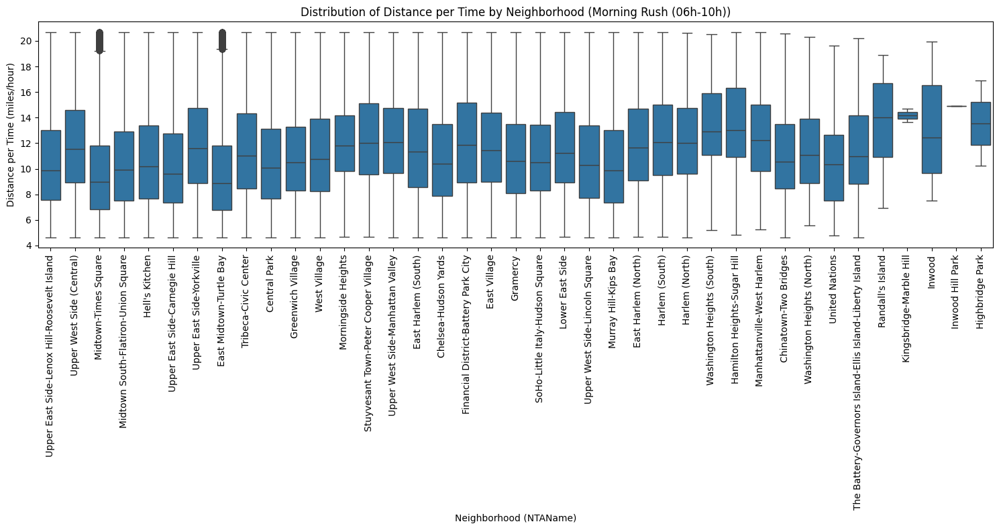

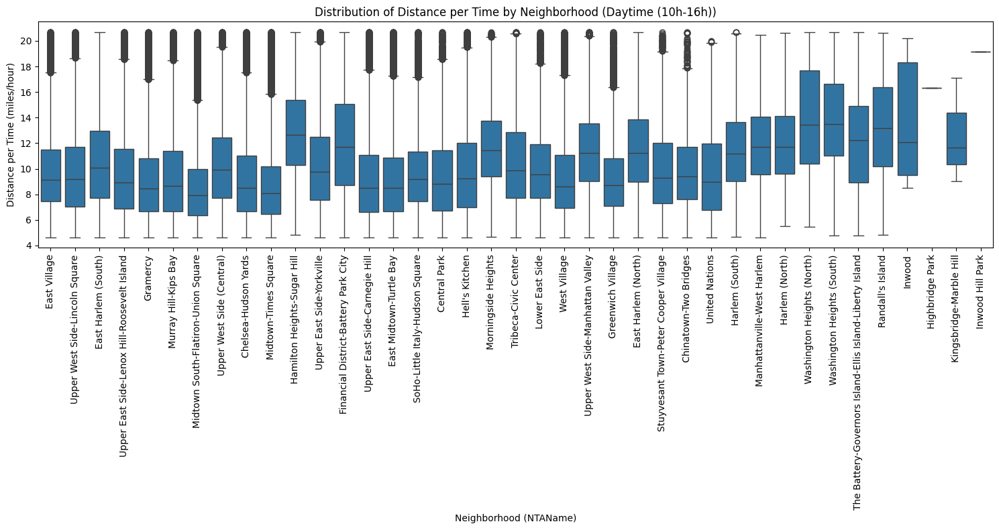

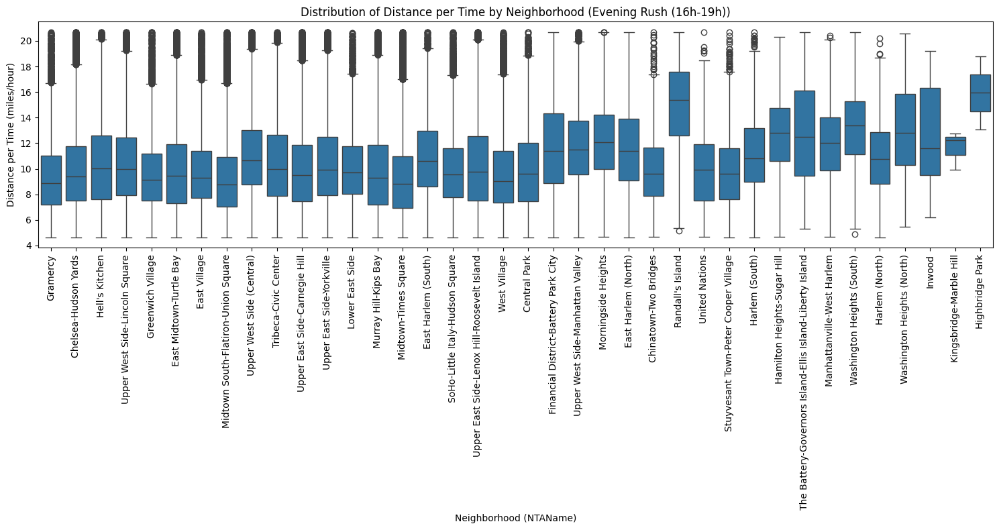

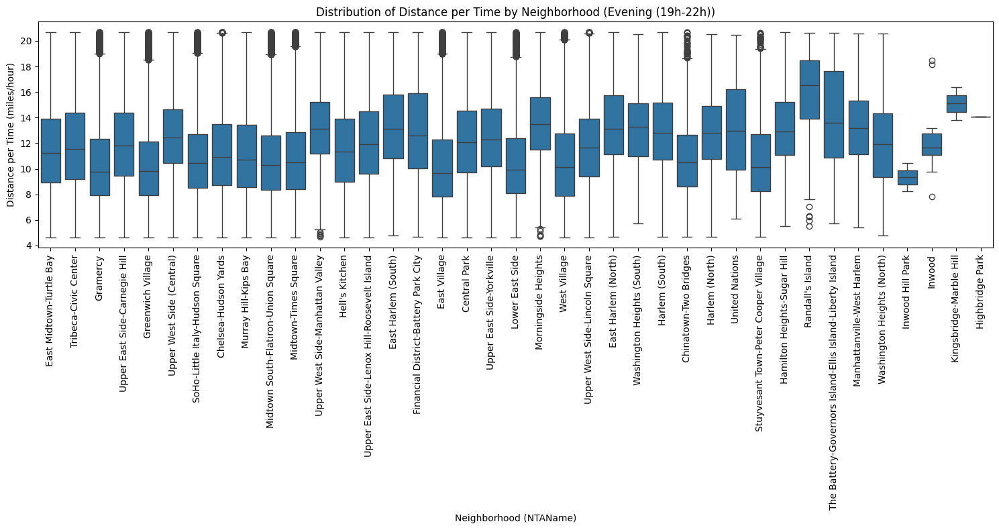

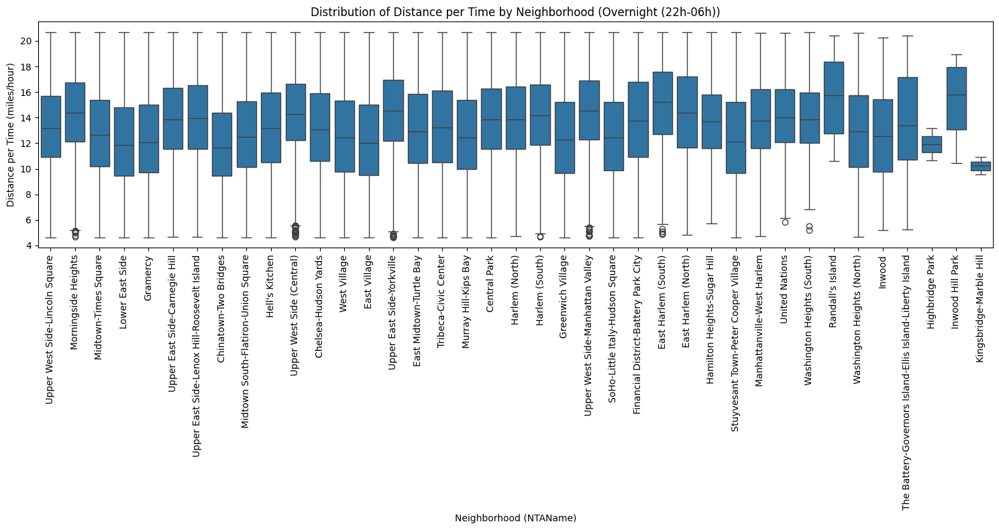

In [119]:
# Define time periods
time_periods = {
    "Morning Rush (06h-10h)": (rides_filtered_percentile['pickup_hour'] >= 6) & (rides_filtered_percentile['pickup_hour'] < 10),
    "Daytime (10h-16h)": (rides_filtered_percentile['pickup_hour'] >= 10) & (rides_filtered_percentile['pickup_hour'] < 16),
    "Evening Rush (16h-19h)": (rides_filtered_percentile['pickup_hour'] >= 16) & (rides_filtered_percentile['pickup_hour'] < 19),
    "Evening (19h-22h)": (rides_filtered_percentile['pickup_hour'] >= 19) & (rides_filtered_percentile['pickup_hour'] < 22),
    "Overnight (22h-06h)": (rides_filtered_percentile['pickup_hour'] >= 22) | (rides_filtered_percentile['pickup_hour'] < 6),
}

# Iterate through each time period and create a box plot
for period_name, condition in time_periods.items():
    df_period = rides_filtered_percentile[condition].copy()

    if not df_period.empty:
        plt.figure(figsize=(15, 8))
        sns.boxplot(data=df_period, x='ntaname', y='dist_per_time')
        plt.title(f'Distribution of Distance per Time by Neighborhood ({period_name})')
        plt.xlabel('Neighborhood (NTAName)')
        plt.ylabel('Distance per Time (miles/hour)')
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()
    else:
        print(f"No data for {period_name}")

Text(0.5, 1.0, 'Pickup and Dropoff Locations in Manhattan')

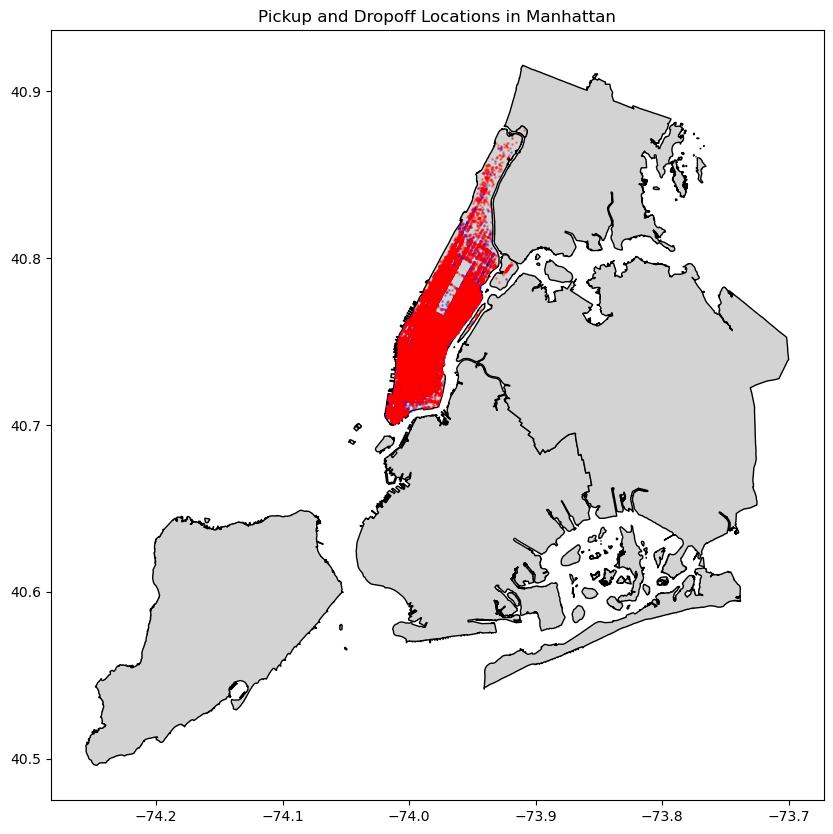

In [ ]:
# Plot a selection of pickup and dropoff locations on the boroughs map
fig, ax = plt.subplots(figsize=(10,10))
#boroughs_latlon=gpd.read_file("Data_Sources\\nyc_borough_boundary.json")
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
ax.scatter(sample_df['pickup_longitude'], sample_df['pickup_latitude'], color='blue', alpha=0.3, s=1, label='Pickup')
ax.scatter(sample_df['dropoff_longitude'], sample_df['dropoff_latitude'], color='red', alpha=0.3, s=1, label='Dropoff')
ax.set_title('Pickup and Dropoff Locations in Manhattan')

# they are all in Manhattan yay!

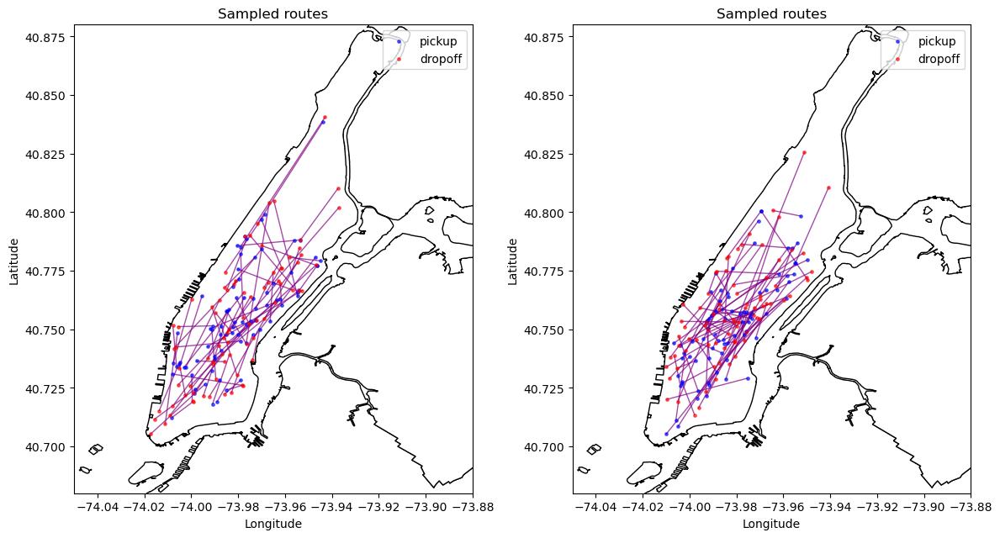

In [ ]:
# Check a few routes

n_per_period = 80  # small selection per period



fig, axes = plt.subplots(1, 2, figsize=(12, 10))
axes = axes.flatten()

for i in range(0,2):
    ax = axes[i]
    # plot borough boundaries for context
    boroughs_latlon.plot(ax=ax, color='white', edgecolor='black')
    df_sample_period = sample_df.sample(n=n_per_period)
    # draw each route
    for _, r in df_sample_period.iterrows():
        ax.plot([r['pickup_longitude'], r['dropoff_longitude']],
                [r['pickup_latitude'], r['dropoff_latitude']],
                color='purple', alpha=0.7, linewidth=1, zorder=2)

    # optional: show pickup / dropoff points for sampled routes
    ax.scatter(df_sample_period['pickup_longitude'], df_sample_period['pickup_latitude'],
               color='blue', s=6, alpha=0.6, label='pickup', zorder=3)
    ax.scatter(df_sample_period['dropoff_longitude'], df_sample_period['dropoff_latitude'],
               color='red', s=6, alpha=0.6, label='dropoff', zorder=3)

    ax.set_title('Sampled routes')
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-74.05,-73.88)
    ax.set_ylim(40.68,40.88)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='upper right')

# hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

# There is no noticeable pattern

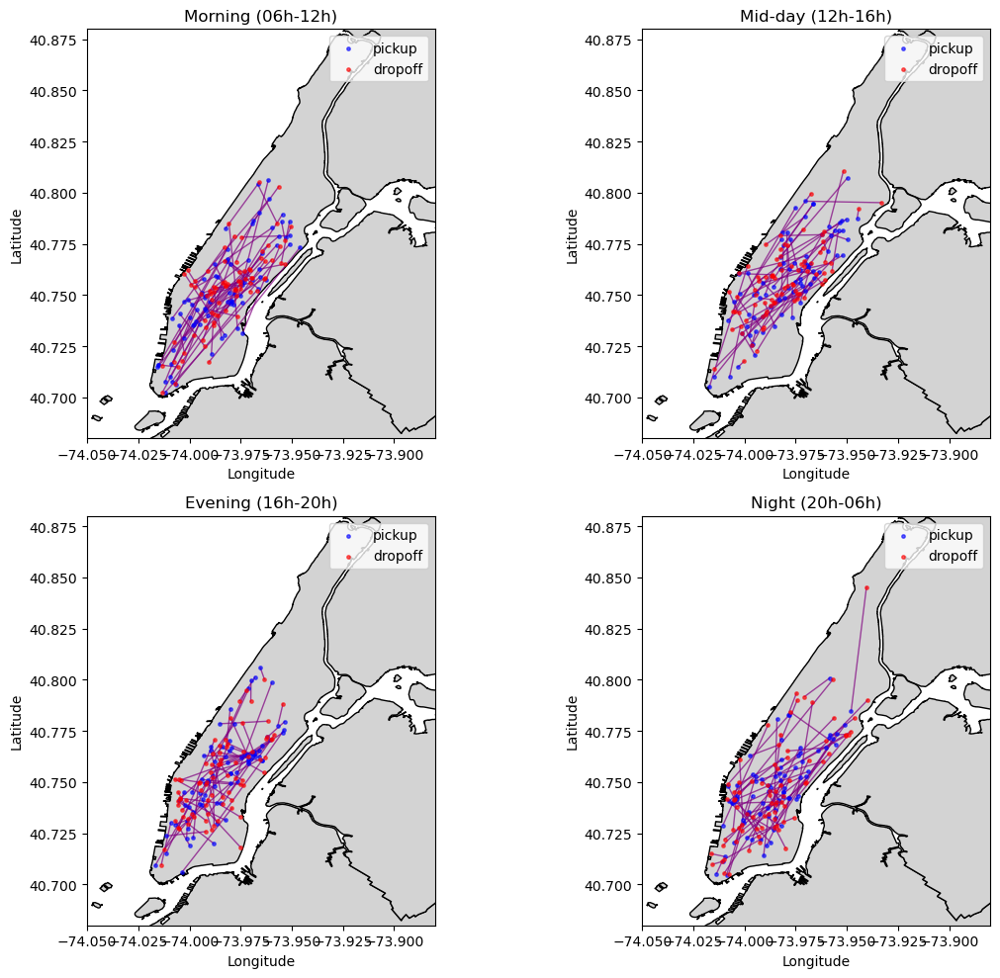

In [ ]:
# Plot a small selection of routes (pickup -> dropoff) by time-of-day periods
# relies on existing variables: sample_df (sample of filtered_df), boroughs_latlon, plt
sample_df = filtered_df.sample(n=40000, random_state=1) if len(filtered_df) > 40000 else filtered_df

n_per_period = 80  # small selection per period
periods = {
    "Morning (06h-12h)": ((sample_df['pickup_hour'] >= 6) & (sample_df['pickup_hour'] < 12), "blue"),
    "Mid-day (12h-16h)":  ((sample_df['pickup_hour'] >= 12) & (sample_df['pickup_hour'] < 16), "green"),
    "Evening (16h-20h)":  ((sample_df['pickup_hour'] >= 16) & (sample_df['pickup_hour'] < 20), "orange"),
    "Night (20h-06h)":    (((sample_df['pickup_hour'] >= 20) | (sample_df['pickup_hour'] < 6)), "purple"),
}

# Plot each time-of-day period on its own subplot (uses existing variables: sample_df, periods, n_per_period, boroughs_latlon, plt)
period_items = list(periods.items())
n_periods = len(period_items)
ncols = 2
nrows = (n_periods + 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 10))
axes = axes.flatten()

for i, (label, (cond, color)) in enumerate(period_items):
    ax = axes[i]
    # plot borough boundaries for context
    boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
    df_period = sample_df.loc[cond].dropna(subset=['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude'])
    if df_period.empty:
        ax.set_title(f"{label} (no data)")
        continue

    df_sample_period = df_period.sample(n=min(n_per_period, len(df_period)))
    # draw each route
    for _, r in df_sample_period.iterrows():
        ax.plot([r['pickup_longitude'], r['dropoff_longitude']],
                [r['pickup_latitude'], r['dropoff_latitude']],
                color='purple', alpha=0.7, linewidth=1, zorder=2)

    # optional: show pickup / dropoff points for sampled routes
    ax.scatter(df_sample_period['pickup_longitude'], df_sample_period['pickup_latitude'],
               color='blue', s=6, alpha=0.6, label='pickup', zorder=3)
    ax.scatter(df_sample_period['dropoff_longitude'], df_sample_period['dropoff_latitude'],
               color='red', s=6, alpha=0.6, label='dropoff', zorder=3)

    ax.set_title(label)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-74.05,-73.88)
    ax.set_ylim(40.68,40.88)
    ax.set_aspect('equal', adjustable='box')
    ax.legend(loc='upper right')

# hide any unused subplots
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

# There is no noticeable pattern

### Spatial maps based on period of day

In [76]:
sample_df = rides_df.sample(n=40000, random_state=5) if len(rides_df) > 40000 else rides_df

periods = {
    "Morning Rush (06h-10h)": ((sample_df['pickup_hour'] >= 7) & (sample_df['pickup_hour'] < 10), "blue"),
    "Daytime (10h-16h)":  ((sample_df['pickup_hour'] >= 12) & (sample_df['pickup_hour'] < 16), "green"),
    "Evening Rush (16h-19h)":  ((sample_df['pickup_hour'] >= 16) & (sample_df['pickup_hour'] < 19), "orange"),
    "Evening (19h-22h)":  ((sample_df['pickup_hour'] >= 16) & (sample_df['pickup_hour'] < 20), "orange"),
    "Overnight (22h-06h)":    (((sample_df['pickup_hour'] >= 20) | (sample_df['pickup_hour'] < 6)), "purple"),
}

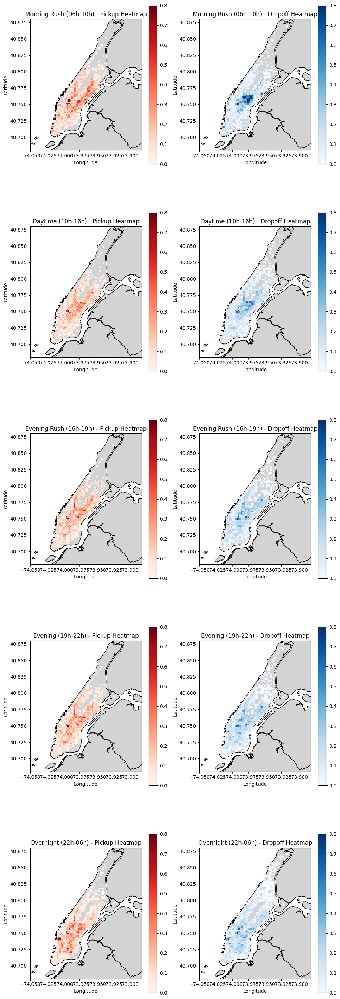

In [79]:
# Create spatial heatmaps for pickup and dropoff locations based on time periods
n_periods = len(periods)
ncols = 1
nrows = (n_periods + 1) // ncols
size_x=10
size_y=6

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(size_x*ncols, size_y*nrows)) # Increased figure size for two heatmaps per row
axes = axes.flatten()

period_items = list(periods.items())

# Define the desired bin size
bin_size = 0.002266

# Calculate the number of bins based on the data range and desired bin size
# Use the overall range of pickup and dropoff longitudes and latitudes
all_longitudes = pd.concat([sample_df['pickup_longitude'], sample_df['dropoff_longitude']]).dropna()
all_latitudes = pd.concat([sample_df['pickup_latitude'], sample_df['dropoff_latitude']]).dropna()

if not all_longitudes.empty:
    lon_range = all_longitudes.max() - all_longitudes.min()
    n_lon_bins = int(np.ceil(lon_range / bin_size))
else:
    n_lon_bins = 80 # Default if no data

if not all_latitudes.empty:
    lat_range = all_latitudes.max() - all_latitudes.min()
    n_lat_bins = int(np.ceil(lat_range / bin_size))
else:
     n_lat_bins = 80 # Default if no data

bins = [n_lon_bins, n_lat_bins]

# Calculate the maximum percentage across all heatmaps for consistent colorbar limits
max_percent = 0
min_percent = 100
for label, (cond, color) in periods.items():
    df_period_pickup = sample_df.loc[cond].dropna(subset=['pickup_longitude', 'pickup_latitude'])
    if not df_period_pickup.empty:
        hist_pickup, _, _ = np.histogram2d(df_period_pickup['pickup_longitude'], df_period_pickup['pickup_latitude'], bins=bins)
        # Calculate percentage for each bin
        hist_pickup_percent = (hist_pickup / hist_pickup.sum()) * 100 if hist_pickup.sum() > 0 else hist_pickup
        max_percent = max(max_percent, hist_pickup_percent.max())
        min_percent = min(min_percent, hist_pickup_percent.min())

    df_period_dropoff = sample_df.loc[cond].dropna(subset=['dropoff_longitude', 'dropoff_latitude'])
    if not df_period_dropoff.empty:
        hist_dropoff, _, _ = np.histogram2d(df_period_dropoff['dropoff_longitude'], df_period_dropoff['dropoff_latitude'], bins=bins)
        # Calculate percentage for each bin
        hist_dropoff_percent = (hist_dropoff / hist_dropoff.sum()) * 100 if hist_dropoff.sum() > 0 else hist_dropoff
        max_percent = max(max_percent, hist_dropoff_percent.max())
        min_percent = min(min_percent, hist_pickup_percent.min())

#min_lim=min_percent*1.1
#max_lim=max_percent*0.5
min_lim=0
max_lim=0.8


for i, (label, (cond, color)) in enumerate(period_items):
    # Pickup heatmap
    ax1 = axes[i * 2]
    # Plot borough boundaries
    boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
    df_period_pickup = sample_df.loc[cond].dropna(subset=['pickup_longitude', 'pickup_latitude'])
    if not df_period_pickup.empty:
        sns.histplot(x='pickup_longitude', y='pickup_latitude', data=df_period_pickup, bins=bins,
                     cmap='Reds', ax=ax1, cbar=True, stat="percent", vmax=max_lim,vmin=min_lim,cbar_kws={'shrink':0.8})
        ax1.set_title(f"{label} - Pickup Heatmap")
        ax1.set_xlabel("Longitude")
        ax1.set_ylabel("Latitude")
        ax1.set_xlim(-74.05,-73.88)
        ax1.set_ylim(40.68,40.88)
        ax1.set_aspect('equal', adjustable='box')
    else:
        ax1.set_title(f"{label} - Pickup Heatmap (no data)")


    # Dropoff heatmap
    ax2 = axes[i * 2 + 1]
    # Plot borough boundaries
    boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
    df_period_dropoff = sample_df.loc[cond].dropna(subset=['dropoff_longitude', 'dropoff_latitude'])
    if not df_period_dropoff.empty:
        sns.histplot(x='dropoff_longitude', y='dropoff_latitude', data=df_period_dropoff, bins=bins,
                     cmap='Blues', ax=ax2, cbar=True, stat="percent", vmax=max_lim,vmin=min_lim,cbar_kws={'shrink':0.8})
        ax2.set_title(f"{label} - Dropoff Heatmap")
        ax2.set_xlabel("Longitude")
        ax2.set_ylabel("Latitude")
        ax2.set_xlim(-74.05,-73.88)
        ax2.set_ylim(40.68,40.88)
        ax2.set_aspect('equal', adjustable='box')
    else:
        ax2.set_title(f"{label} - Dropoff Heatmap (no data)")


# Hide any unused subplots
for j in range(i * 2 + 2, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

#these should be binned into approximately blocks of 200m

#might want to do in terms of some normalised log counts

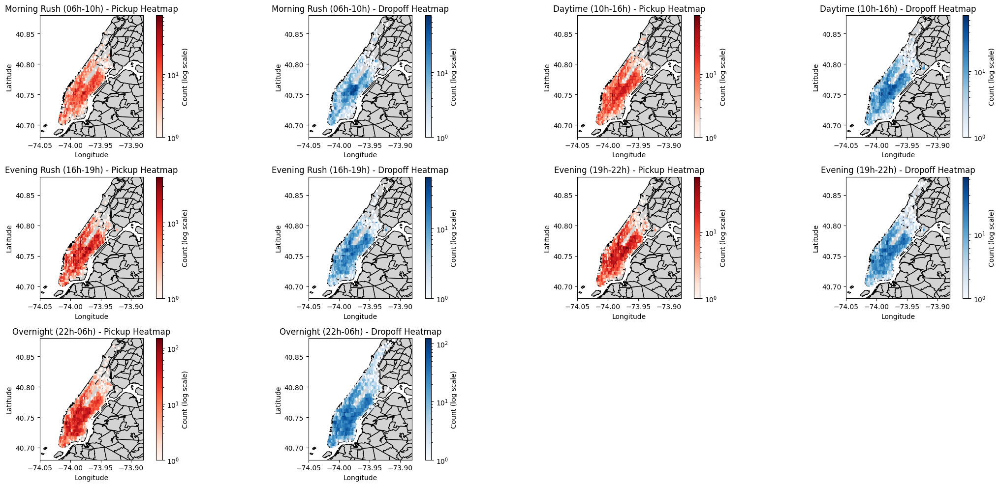

In [66]:
# Create spatial heatmaps for pickup and dropoff locations based on time periods
n_periods = len(periods)
ncols = 2
nrows = (n_periods + 1) // ncols

fig, axes = plt.subplots(nrows, ncols * 2, figsize=(22, 10)) # Increased figure size for two heatmaps per row
axes = axes.flatten()

period_items = list(periods.items())

for i, (label, (cond, color)) in enumerate(period_items):
    # Pickup heatmap
    ax1 = axes[i * 2]
    # Plot neighbourhood boundaries
    neighbourhood_shp.plot(ax=ax1, color='lightgrey', edgecolor='black')
    df_period_pickup = sample_df.loc[cond].dropna(subset=['pickup_longitude', 'pickup_latitude'])
    if not df_period_pickup.empty:
        hexbin_pickup = ax1.hexbin(df_period_pickup['pickup_longitude'], df_period_pickup['pickup_latitude'], gridsize=50, cmap='Reds', bins='log')
        ax1.set_title(f"{label} - Pickup Heatmap")
        ax1.set_xlabel("Longitude")
        ax1.set_ylabel("Latitude")
        ax1.set_xlim(-74.05,-73.88)
        ax1.set_ylim(40.68,40.88)
        ax1.set_aspect('equal', adjustable='box')
        fig.colorbar(hexbin_pickup, ax=ax1, label='Count (log scale)')
    else:
        ax1.set_title(f"{label} - Pickup Heatmap (no data)")


    # Dropoff heatmap
    ax2 = axes[i * 2 + 1]
    # Plot neighbourhood boundaries
    neighbourhood_shp.plot(ax=ax2, color='lightgrey', edgecolor='black')
    df_period_dropoff = sample_df.loc[cond].dropna(subset=['dropoff_longitude', 'dropoff_latitude'])
    if not df_period_dropoff.empty:
        hexbin_dropoff = ax2.hexbin(df_period_dropoff['dropoff_longitude'], df_period_dropoff['dropoff_latitude'], gridsize=50, cmap='Blues', bins='log')
        ax2.set_title(f"{label} - Dropoff Heatmap")
        ax2.set_xlabel("Longitude")
        ax2.set_ylabel("Latitude")
        ax2.set_xlim(-74.05,-73.88)
        ax2.set_ylim(40.68,40.88)
        ax2.set_aspect('equal', adjustable='box')
        fig.colorbar(hexbin_dropoff, ax=ax2, label='Count (log scale)')

    else:
        ax2.set_title(f"{label} - Dropoff Heatmap (no data)")


# Hide any unused subplots
for j in range(i * 2 + 2, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()

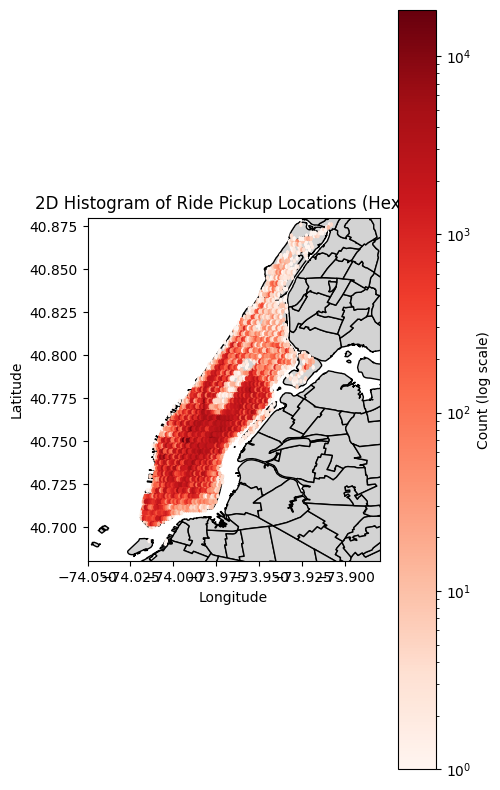

In [72]:
fig, ax = plt.subplots(figsize=(5, 8))
neighbourhood_shp.plot(ax=ax, color='lightgrey', edgecolor='black')
# Use hexbin to create a 2D histogram
hexbin = ax.hexbin(rides_with_neighbourhood['pickup_longitude'], rides_with_neighbourhood['pickup_latitude'], gridsize=100, cmap='Reds', bins='log')

ax.set_title('2D Histogram of Ride Pickup Locations (Hexbin)')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05, -73.88)
ax.set_ylim(40.68, 40.88)
ax.set_aspect('equal', adjustable='box')

# Add a colorbar
cbar = fig.colorbar(hexbin, ax=ax)
cbar.set_label('Count (log scale)')

plt.tight_layout()
plt.show()

### Clustering based on ride characteristics

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Sample the entire week's data
# Adjust sample size as needed
sample_size_kmeans = 50000 # Increased sample size for better representation
rides_sample_kmeans = rides_df.sample(n=sample_size_kmeans, random_state=42) if len(rides_df) > sample_size_kmeans else rides_df.copy()


# Select features for clustering
# Using pickup_numeric for pickup time
kmeans_features = rides_sample_kmeans[['pickup_numeric', 'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'trip_distance', 'fare_amount']]

# Scale the features
scaler_kmeans = StandardScaler()
scaled_features_kmeans = scaler_kmeans.fit_transform(kmeans_features)

# Perform KMeans clustering
# Choose a number of clusters (n_clusters) - this is a hyperparameter that needs tuning
# A starting point could be based on the number of clusters found by HDBSCAN or simply an educated guess
n_clusters_kmeans = 400 # Example: starting with 400 clusters
kmeans = KMeans(n_clusters=n_clusters_kmeans, random_state=42, n_init=10)
clusters_kmeans = kmeans.fit_predict(scaled_features_kmeans)

# Add cluster labels to the dataframe
rides_sample_kmeans['kmeans_cluster'] = clusters_kmeans

# Display clustering results and sample data with cluster labels
print(f"Number of samples used for KMeans: {len(rides_sample_kmeans)}")
print(f"Number of KMeans clusters: {n_clusters_kmeans}")

display(rides_sample_kmeans.head())

## Clustering

The plan: use clustering to identify possible aggregateable rides, and then use optimisation to assign aggregations

### Visualise clustering

In [ ]:
# Let's try to cluster thigns!
# Also we will talk about our metric here... Ride Aggregation Efficiency Metric...
# Set our assumptions and approach
# Define our metric
# define clustering approach

In [ ]:
# Select points with pickup times between 07:00 and 07:30 on June 6th
start_hh_mm='09:00'
end_hh_mm='09:10'
day_of_week='Monday'
start_time = pd.to_datetime('2013-06-03 '+start_hh_mm)
end_time = pd.to_datetime('2013-06-03 '+end_hh_mm)
rides_monday=rides_df[rides_df['pickup_weekday']==day_of_week]
sample_monday = rides_monday.sample(n=50000, random_state=1) if len(rides_monday) > 50000 else rides_monday

rides_monday_morning = sample_monday[
    (sample_monday['pickup_datetime'] >= start_time) &
    (sample_monday['pickup_datetime'] < end_time)
]

# Sample up to 1000 points if there are more than 1000
sample_size = min(5000, len(rides_monday_morning))
rides_sample = rides_monday_morning.sample(n=sample_size, random_state=42) if sample_size > 0 else rides_monday_morning.copy()



print(f"Number of rides on Monday: {len(rides_monday)}")
print(f"Number of rides found between 07:30 and 08:00 on Monday: {len(rides_monday_morning)}")
print(f"Number of rides selected for sample: {len(rides_sample)}")


Number of rides on Monday: 375304
Number of rides found between 07:30 and 08:00 on Monday: 553
Number of rides selected for sample: 553


Text(0.5, 1.0, 'Dropoff from rides picked up Monday 09:00-09:30')

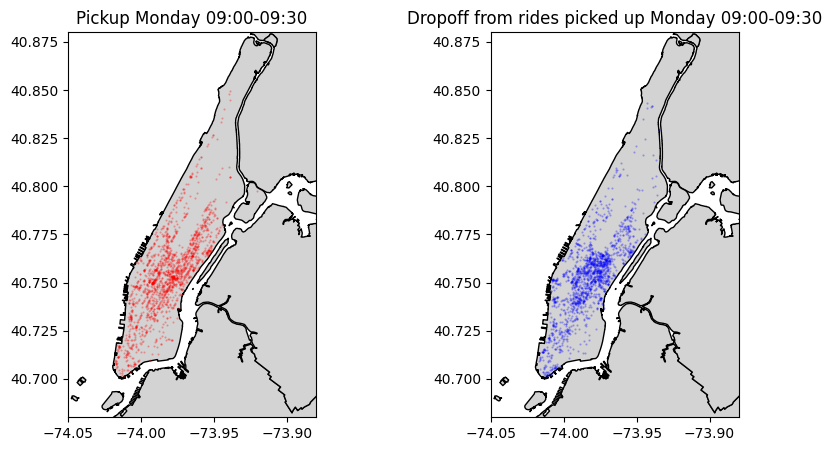

In [ ]:

#plot them in a scatter
fig, ax = plt.subplots(1,2,figsize=(10,5))
# Plot borough boundaries
ax1=ax[0]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
ax1.scatter(rides_sample['pickup_longitude'], rides_sample['pickup_latitude'], color='red', alpha=0.3, s=0.3, label='Pickup')
ax1.set_xlim(-74.05,-73.88)
ax1.set_ylim(40.68,40.88)
ax1.set_title(f"Pickup {day_of_week} {start_hh_mm}-{end_hh_mm}")

ax2=ax[1]
boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
ax2.scatter(rides_sample['dropoff_longitude'], rides_sample['dropoff_latitude'], color='blue', alpha=0.3, s=0.3, label='Dropoff')
ax2.set_xlim(-74.05,-73.88)
ax2.set_ylim(40.68,40.88)
ax2.set_title(f"Dropoff from rides picked up {day_of_week} {start_hh_mm}-{end_hh_mm}")

Text(0.5, 1.0, 'Dropoff from rides picked up 09:00-09:30 Monday')

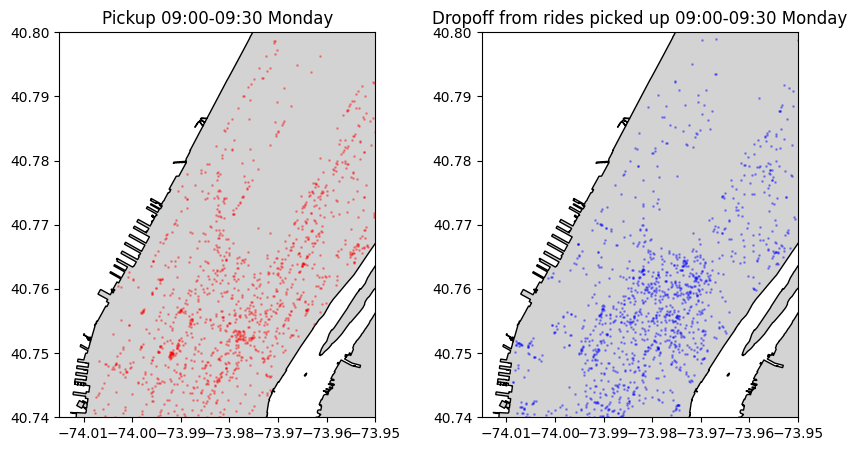

In [ ]:
#zoom in to a smaller area
#plot them in a scatter
fig, ax = plt.subplots(1,2,figsize=(10,5))
# Plot borough boundaries
ax1=ax[0]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
ax1.scatter(rides_sample['pickup_longitude'], rides_sample['pickup_latitude'], color='red', alpha=0.3, s=1, label='Pickup')
ax1.set_xlim(-74.015,-73.95)
ax1.set_ylim(40.74,40.8)
ax1.set_title(f"Pickup {start_hh_mm}-{end_hh_mm} Monday")

ax2=ax[1]
boroughs_latlon.plot(ax=ax2, color='lightgrey', edgecolor='black')
ax2.scatter(rides_sample['dropoff_longitude'], rides_sample['dropoff_latitude'], color='blue', alpha=0.3, s=1, label='Dropoff')
ax2.set_xlim(-74.015,-73.95)
ax2.set_ylim(40.74,40.8)
ax2.set_title(f"Dropoff from rides picked up {start_hh_mm}-{end_hh_mm} Monday")

#Can see some clear clusters!

### Perform clustering (hdbscan, dbscan, kmeans)

In [ ]:
# We want to cluster based on pickup and drop off coordinates, and pickup time
#using the same cluster features for all 3 clustering methods
#modify pickup_numeric to only be the number of minutes past the original

cluster_features=rides_sample[['pickup_numeric','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]
cluster_features['pickup_numeric']=(cluster_features['pickup_numeric']-min(cluster_features['pickup_numeric'])+1)
scaler=StandardScaler()
scaled_features=scaler.fit_transform(cluster_features)
scaled_features

array([[-0.51683764,  1.15875022,  0.94031613, -0.65619519, -1.29761971],
       [-0.16913543,  1.61065265,  0.58001141,  0.08790813,  0.6928391 ],
       [ 0.52626898, -0.3989303 , -0.44214103,  0.27790575, -0.40535702],
       ...,
       [ 0.87397119,  0.21239031, -0.10746448, -0.9930681 ,  0.21625595],
       [-0.86453984, -0.11499265,  0.74691492, -0.52955172,  1.00716116],
       [ 1.22167339,  1.45716964,  1.15856753,  0.02455397,  0.50755348]])

#### hdbscan

In [ ]:
# We want to cluster based on pickup and drop off coordinates, and pickup time

# <class 'pandas.core.frame.DataFrame'>
# RangeIndex: 2809597 entries, 0 to 2809596
# Data columns (total 12 columns):
#  #   Column             Dtype
# ---  ------             -----
#  0   pickup_datetime    datetime64[ns]
#  1   dropoff_datetime   datetime64[ns]
#  2   pickup_longitude   float64
#  3   pickup_latitude    float64
#  4   dropoff_longitude  float64
#  5   dropoff_latitude   float64
#  6   trip_time_in_secs  int64
#  7   trip_distance      float64
#  8   fare_amount        float64
#  9   trip_time_in_mins   float64
#  10  pickup_hour        int32
#  11  pickup_weekday     object'

#convert pickup_datetime to something numeric
#from sklearn.cluster import HDBSCAN
#from hdbscan import HDBSCAN

# perform HDBSCAN clustering with the defined parameters

# User wants min_cluster_size = 2 and max_cluster_size = 5.
# HDBSCAN has a 'min_cluster_size' parameter. It does not have a direct 'max_cluster_size' parameter.
# The 'cluster_selection_epsilon' parameter can sometimes help in splitting larger clusters,
# but it's not a strict maximum size.
# Let's use min_cluster_size and a relatively small cluster_selection_epsilon to encourage smaller clusters.
# We can also potentially filter clusters by size after clustering.

min_clust_size=2
clust_sel_eps_max=0.5
clust_sel_eps_min=0
hdbscan = HDBSCAN(min_cluster_size=min_clust_size,cluster_selection_epsilon_max=clust_sel_eps_max)
#hdbscan = HDBSCAN(min_cluster_size=2,store_centers='centroid')
clusters = hdbscan.fit_predict(scaled_features)


# Add cluster labels to the dataframe
rides_sample['hdbscan_cluster'] = clusters

# Print some clustering results
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
avg_cluster_size = np.mean(np.bincount(clusters[clusters != -1]))
max_cluster_size=np.max(np.bincount(clusters[clusters != -1]))
print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")
print(f"Average cluster size: {avg_cluster_size}")
print(f"Max cluster size: {max_cluster_size}")
print(f"Percent rides aggregated: {(sample_size-n_noise)/sample_size}")

# Display the first few rows with cluster labels
display(rides_sample.head())


Estimated number of clusters: 90
Estimated number of noise points: 1254
Average cluster size: 4.522222222222222
Max cluster size: 20
Percent rides aggregated: 0.36666666666666664


/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric,cluster,hdbscan_cluster,dbscan_cluster,kmeans_cluster
357361,2013-06-03 09:16:00,2013-06-03 09:37:00,-73.975006,40.752567,-73.953590,40.766773,1260,2.49,14.0,21.000000,9,Monday,10916,-1,-1,-1,52
370482,2013-06-03 09:25:00,2013-06-03 09:30:00,-73.997818,40.746113,-74.004883,40.751945,300,0.81,5.5,5.000000,9,Monday,10925,-1,9,-1,88
1853761,2013-06-03 09:01:45,2013-06-03 09:18:50,-74.004112,40.721931,-74.006439,40.746204,1025,2.10,12.0,17.083333,9,Monday,10901,-1,-1,-1,13
1806296,2013-06-03 09:04:55,2013-06-03 09:12:40,-74.014984,40.716759,-74.008621,40.712364,465,0.50,6.5,7.750000,9,Monday,10904,-1,-1,-1,58
1826402,2013-06-03 09:18:00,2013-06-03 09:24:11,-73.991478,40.741035,-73.997147,40.734856,370,0.60,5.5,6.166667,9,Monday,10918,-1,-1,-1,61


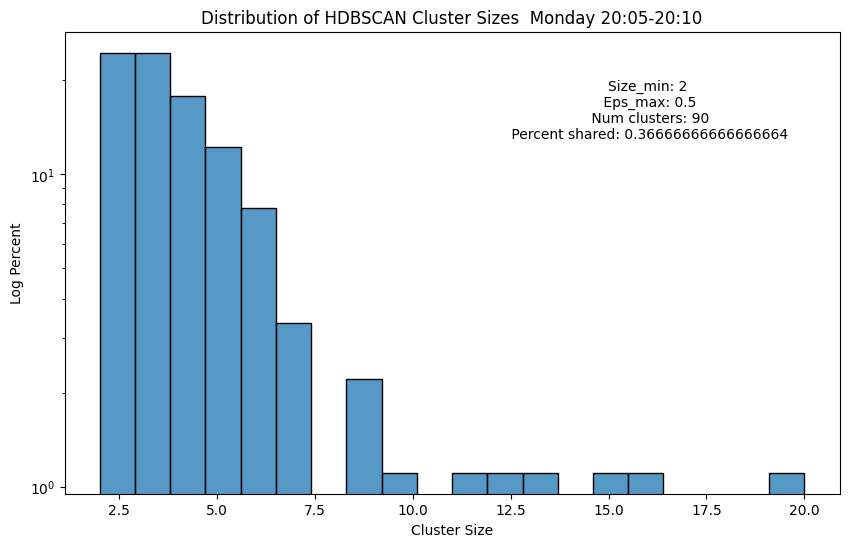

In [ ]:
# Calculate the size of each cluster (excluding noise)
cluster_sizes = rides_sample['hdbscan_cluster'].value_counts()
cluster_sizes = cluster_sizes[cluster_sizes.index != -1] # Exclude noise cluster

# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=20, kde=False,stat="percent")
plt.text(max(cluster_sizes)*0.8, max_cluster_size*0.8, f"Size_min: {min_clust_size}\n Eps_max: {clust_sel_eps_max}\n Num clusters: {n_clusters}\n Percent shared: {(sample_size-n_noise)/sample_size}", horizontalalignment='center',
     verticalalignment='center')
plt.title(f'Distribution of HDBSCAN Cluster Sizes  {day_of_week} {start_hh_mm}-{end_hh_mm}')
plt.xlabel('Cluster Size')
plt.ylabel('Log Percent')
plt.yscale('log') # Use a log scale for the y-axis to better visualize smaller clusters

plt.show()

/tmp/ipython-input-2621728160.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', n_clusters)


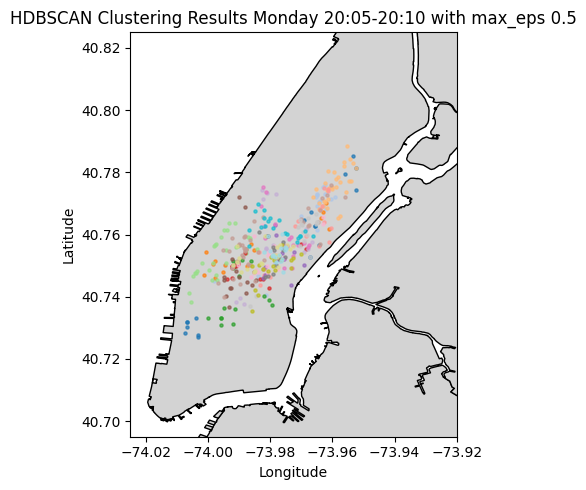

In [ ]:
# @title
# Plot the clustered points on the map
fig, ax = plt.subplots(figsize=(6, 5))
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot noise points in grey
#noise_points = rides_sample[rides_sample['cluster'] == -1]
#ax.scatter(noise_points['pickup_longitude'], noise_points['pickup_latitude'], color='grey', s=5, alpha=0.5, label='Noise')

# Plot clustered points with different colors
clustered_points = rides_sample[rides_sample['hdbscan_cluster'] != -1]
# Use a colormap for clusters
cmap = plt.cm.get_cmap('tab20', n_clusters)
for cluster_id in sorted(clustered_points['hdbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['hdbscan_cluster'] == cluster_id]
    ax.scatter(cluster_data['pickup_longitude'], cluster_data['pickup_latitude'],
               color=cmap(cluster_id), s=5, alpha=0.7, label=f'Cluster {cluster_id}')

ax.set_title(f'HDBSCAN Clustering Results {day_of_week} {start_hh_mm}-{end_hh_mm} with max_eps {clust_sel_eps_max}')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.025,-73.92)
ax.set_ylim(40.695,40.825)
ax.set_aspect('equal', adjustable='box')
# Add a legend, but it might be too crowded with many clusters
# ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [ ]:
# draw a circle for each cluster at some center point
hdbscan_cluster_circles=[]
for cluster_id in sorted(clustered_points['hdbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['hdbscan_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    hdbscan_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
hdbscan_cluster_circles_df = pd.DataFrame(hdbscan_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [ ]:
#plot in folium
import folium
import numpy as np
import matplotlib

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    if label == -1:
        return "gray"  # noise
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


# add the clusters
cluster_centroids = clustered_points.groupby('hdbscan_cluster')[['pickup_latitude', 'pickup_longitude']].mean()
cluster_sizes=clustered_points['hdbscan_cluster'].value_counts()

for centroid in cluster_centroids.itertuples():
    folium.CircleMarker(
        location=[centroid[1], centroid[2]],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {centroid[0]}" # Add tooltip to show cluster ID on hover
    ).add_to(m)

for index,circle in hdbscan_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


# plot the clustered points and the noise points
for index, row in rides_sample.iterrows():
    cluster_id = row['hdbscan_cluster']
    color = color_for_label(cluster_id)
    size= 0.3 if cluster_id == -1 else 5

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)
#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/hdbscan05.html')
display(m)

/tmp/ipython-input-1106212080.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-1106212080.py:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


#### dbscan

In [ ]:
#use dbscan instead with max epsilon
sample_min=2
epsilon=0.25 #maximum radius is 561m for 0.3, for 0.25 it is 390
dbscan = DBSCAN(min_samples=sample_min,eps=epsilon)
clusters = dbscan.fit_predict(scaled_features)
#problem here is that it's not an even density

# Add cluster labels to the dataframe
rides_sample['dbscan_cluster'] = clusters

# Print some clustering results
n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise = list(clusters).count(-1)
avg_cluster_size = np.mean(np.bincount(clusters[clusters != -1]))
max_cluster_size=np.max(np.bincount(clusters[clusters != -1]))

print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")
print(f"Average cluster size: {avg_cluster_size}")
print(f"Max cluster size: {max_cluster_size}")

# Display the first few rows with cluster labels
display(rides_sample.head())


Estimated number of clusters: 74
Estimated number of noise points: 1496
Average cluster size: 2.22972972972973
Max cluster size: 5


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric,cluster,hdbscan_cluster,dbscan_cluster
357361,2013-06-03 09:16:00,2013-06-03 09:37:00,-73.975006,40.752567,-73.953590,40.766773,1260,2.49,14.0,21.000000,9,Monday,10916,-1,-1,-1
370482,2013-06-03 09:25:00,2013-06-03 09:30:00,-73.997818,40.746113,-74.004883,40.751945,300,0.81,5.5,5.000000,9,Monday,10925,-1,9,-1
1853761,2013-06-03 09:01:45,2013-06-03 09:18:50,-74.004112,40.721931,-74.006439,40.746204,1025,2.10,12.0,17.083333,9,Monday,10901,-1,-1,-1
1806296,2013-06-03 09:04:55,2013-06-03 09:12:40,-74.014984,40.716759,-74.008621,40.712364,465,0.50,6.5,7.750000,9,Monday,10904,-1,-1,-1
1826402,2013-06-03 09:18:00,2013-06-03 09:24:11,-73.991478,40.741035,-73.997147,40.734856,370,0.60,5.5,6.166667,9,Monday,10918,-1,-1,-1


I prefer using hdbscan to get some initial clusters and then doing optimisation vs kmeans


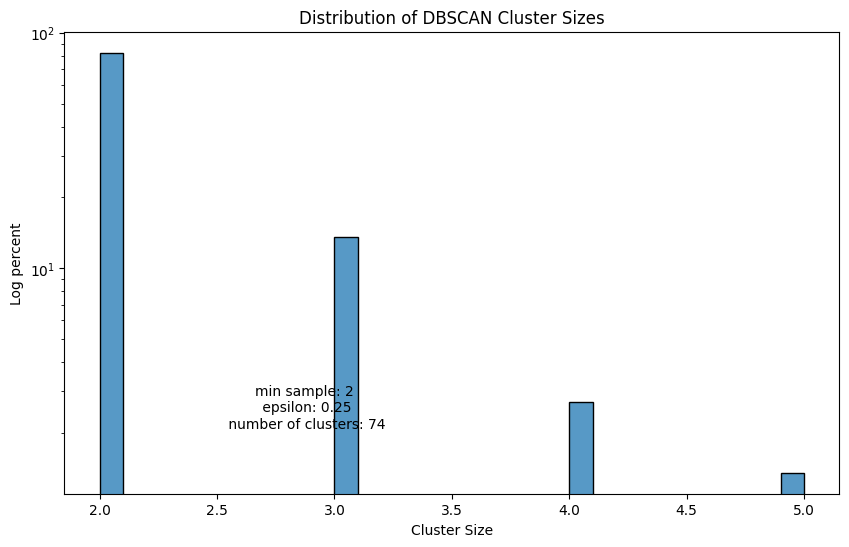

In [ ]:
# points that are clustered
clustered_points = rides_sample[rides_sample['dbscan_cluster'] != -1]

# Calculate the size of each cluster (excluding noise)
cluster_sizes = rides_sample['dbscan_cluster'].value_counts()
cluster_sizes = cluster_sizes[cluster_sizes.index != -1] # Exclude noise cluster

# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title('Distribution of DBSCAN Cluster Sizes')
plt.xlabel('Cluster Size')
plt.ylabel('Log percent')
plt.yscale('log') # Use a log scale for the y-axis to better visualize smaller clusters
plt.text(0.5, 0.2, f"min sample: {sample_min}\n epsilon: {epsilon}\n number of clusters: {n_clusters}", horizontalalignment='center',
     verticalalignment='center', transform=ax.transAxes)
plt.show()

/tmp/ipython-input-37460583.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab20', n_clusters)


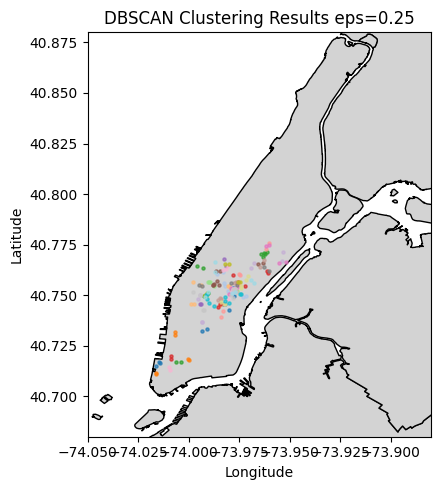

In [ ]:
# Plot the clustered points on the map
fig, ax = plt.subplots(figsize=(6, 5))
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')

# Plot noise points in grey
#noise_points = rides_sample[rides_sample['cluster'] == -1]
#ax.scatter(noise_points['pickup_longitude'], noise_points['pickup_latitude'], color='grey', s=5, alpha=0.5, label='Noise')


# Use a colormap for clusters
cmap = plt.cm.get_cmap('tab20', n_clusters)
for cluster_id in sorted(clustered_points['dbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['dbscan_cluster'] == cluster_id]
    ax.scatter(cluster_data['pickup_longitude'], cluster_data['pickup_latitude'],
               color=cmap(cluster_id), s=5, alpha=0.7, label=f'Cluster {cluster_id}')

ax.set_title(f'DBSCAN Clustering Results eps={epsilon}')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05,-73.88)
ax.set_ylim(40.68,40.88)
ax.set_aspect('equal', adjustable='box')


plt.tight_layout()
plt.show()

#when using dbscan and not heirachel, it ends up putting everything 'dense' into one cluster

In [ ]:
# draw a circle for each cluster at some center point
dbscan_cluster_circles=[]
for cluster_id in sorted(clustered_points['dbscan_cluster'].unique()):
    cluster_data = clustered_points[clustered_points['dbscan_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    dbscan_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
dbscan_cluster_circles_df = pd.DataFrame(dbscan_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [ ]:
#can also look at some aggregated ride stats
cluster_averages = clustered_points.groupby('dbscan_cluster').agg(
    average_pickup_longitude=('pickup_longitude', 'mean'),
    average_pickup_latitude=('pickup_latitude', 'mean'),
    average_dropoff_longitude=('dropoff_longitude', 'mean'),
    average_dropoff_latitude=('dropoff_latitude', 'mean'),
    average_pickup_numeric=('pickup_numeric', 'mean')
).sort_values(by='average_pickup_numeric', ascending=True)



print("Average characteristics for each cluster:")
display(cluster_averages)

Average characteristics for each cluster:


,average_pickup_longitude,average_pickup_latitude,average_dropoff_longitude,average_dropoff_latitude,average_pickup_numeric
dbscan_cluster,,,,,
34,-73.968384,40.764776,-73.955071,40.783043,10901.000000
39,-73.985485,40.762084,-73.995655,40.765491,10902.000000
29,-73.983345,40.740622,-73.998512,40.729477,10902.500000
59,-73.975124,40.756371,-73.973240,40.759602,10903.000000
49,-73.979686,40.750036,-73.982456,40.769194,10903.500000
...,...,...,...,...,...
72,-73.977596,40.751283,-73.988170,40.740444,10927.500000
27,-73.960934,40.774261,-73.969532,40.763155,10927.500000
8,-74.015980,40.711270,-73.993908,40.737740,10928.500000


In [ ]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    if label == -1:
        return "gray"  # Noise
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


# add the clusters
cluster_centroids = clustered_points.groupby('dbscan_cluster')[['pickup_latitude', 'pickup_longitude']].mean()
cluster_sizes=clustered_points['dbscan_cluster'].value_counts()

for centroid in cluster_centroids.itertuples():
    folium.CircleMarker(
        location=[centroid[1], centroid[2]],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {centroid[0]}" # Add tooltip to show cluster ID on hover
    )

for index,circle in dbscan_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


# plot the clustered points and the noise points
for index, row in rides_sample.iterrows():
    cluster_id = row['dbscan_cluster']
    color = color_for_label(cluster_id)
    size= 0.3 if cluster_id == -1 else 5

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-1167989952.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-1167989952.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


#### kmeans

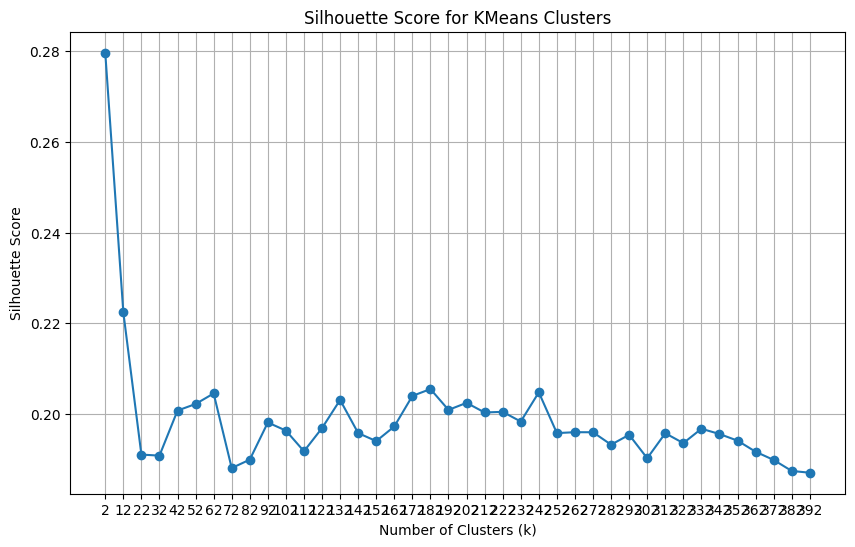

In [ ]:
#try using kmeans with similar number of clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt


# Calculate silhouette score for a range of cluster numbers
silhouette_scores = []
k_range = range(2,402,10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(scaled_features)
    score = silhouette_score(scaled_features, cluster_labels)
    silhouette_scores.append(score)

# Plot the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for KMeans Clusters')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.show()

In [ ]:

n_clusters=130
kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
clusters = kmeans.fit_predict(scaled_features)

# Add cluster labels to the dataframe
rides_sample['kmeans_cluster'] = clusters

cluster_sizes = rides_sample['kmeans_cluster'].value_counts()

#number of clusters with sizes more than 2
n_valid_clusters = len(cluster_sizes[cluster_sizes > 2])
n_valid_rides=sum(cluster_sizes[cluster_sizes>2])

print(f"Number of clusters with more than 2 rides: {n_valid_clusters} or {round(n_valid_clusters/n_clusters*100,2)}%")
print(f"Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/sample_size*100,2)}% rides")


Number of clusters with more than 2 rides: 123 or 94.62%
Number of rides successfully clustered: 1649 or 99.28% rides


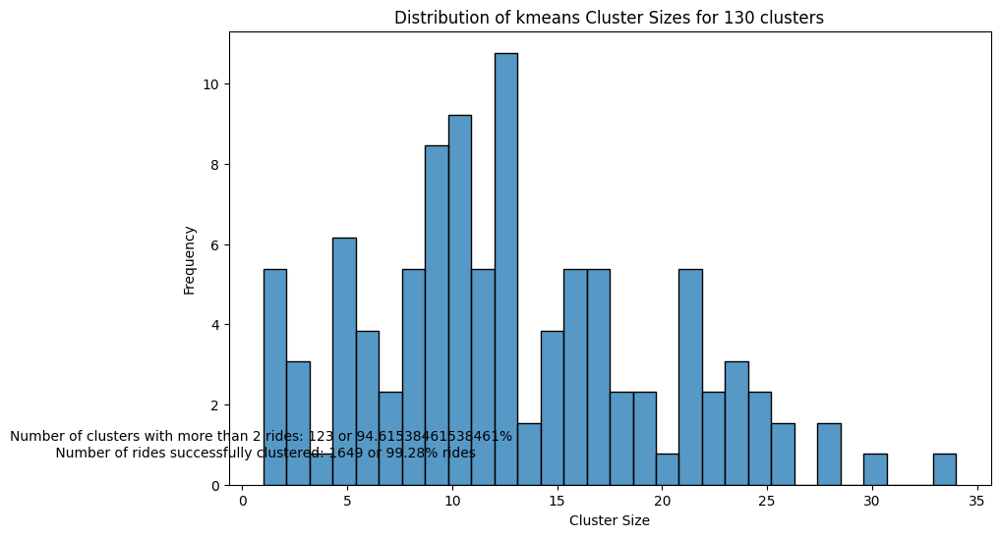

In [ ]:


# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title(f'Distribution of kmeans Cluster Sizes for {n_clusters} clusters')
plt.text(1, 1, f"Number of clusters with more than 2 rides: {n_valid_clusters} or {n_valid_clusters/n_clusters*100}% \n Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/sample_size*100,2)}% rides", horizontalalignment='center',
     verticalalignment='center')
plt.xlabel('Cluster Size')
plt.ylabel('Frequency')

plt.show()

In [ ]:
#summarise clusters so we can plot them

clustered_points_kmeans = rides_sample[rides_sample['kmeans_cluster'] != -1].copy() # KMeans doesn't produce noise (-1) but keep for consistency


# Group by cluster and calculate the mean longitude, latitude, and count (size)
cluster_summary = clustered_points_kmeans.groupby('kmeans_cluster').agg(
    pickup_longitude=('pickup_longitude', 'mean'),
    pickup_latitude=('pickup_latitude', 'mean'),
    dropoff_longitude=('dropoff_longitude', 'mean'),
    dropoff_latitude=('dropoff_latitude', 'mean'),
    cluster_size=('kmeans_cluster', 'count')
)

# Label valid clusters in cluster_summary
cluster_summary['is_valid'] = cluster_summary['cluster_size'] > 2

# Indicate a 'kmeans_valid' column in clustered_points_kmeans based on cluster_summary
clustered_points_kmeans = clustered_points_kmeans.merge(
    cluster_summary[['is_valid']], left_on='kmeans_cluster', right_index=True
)
clustered_points_kmeans.rename(columns={'is_valid': 'kmeans_valid'}, inplace=True)
clustered_points_kmeans=clustered_points_kmeans[clustered_points_kmeans['kmeans_valid']]


In [ ]:
#can also look at some aggregated ride stats
cluster_averages = clustered_points_kmeans.groupby('kmeans_cluster').agg(
    average_pickup_longitude=('pickup_longitude', 'mean'),
    average_pickup_latitude=('pickup_latitude', 'mean'),
    average_dropoff_longitude=('dropoff_longitude', 'mean'),
    average_dropoff_latitude=('dropoff_latitude', 'mean'),
    average_pickup_numeric=('pickup_numeric', 'mean')
).sort_values(by='average_pickup_numeric', ascending=True)



print("Average characteristics for each cluster:")
#cluster_averages.to_csv('/content/drive/MyDrive/Colab Notebooks/colab data/cluster_averages.csv')
display(cluster_averages)

Average characteristics for each cluster:


,average_pickup_longitude,average_pickup_latitude,average_dropoff_longitude,average_dropoff_latitude,average_pickup_numeric
kmeans_cluster,,,,,
25,-73.964265,40.776003,-73.950836,40.788727,10901.000000
68,-73.982954,40.749836,-73.995449,40.740098,10901.125000
73,-74.002801,40.740316,-74.004305,40.735267,10901.222222
57,-73.970748,40.758355,-73.971231,40.758249,10901.384615
98,-73.994942,40.746617,-73.981145,40.755367,10901.809524
...,...,...,...,...,...
127,-73.975660,40.751590,-73.958913,40.771947,10927.333333
37,-74.001289,40.735957,-73.957228,40.769959,10927.400000
116,-74.005286,40.725366,-73.975931,40.745756,10927.400000


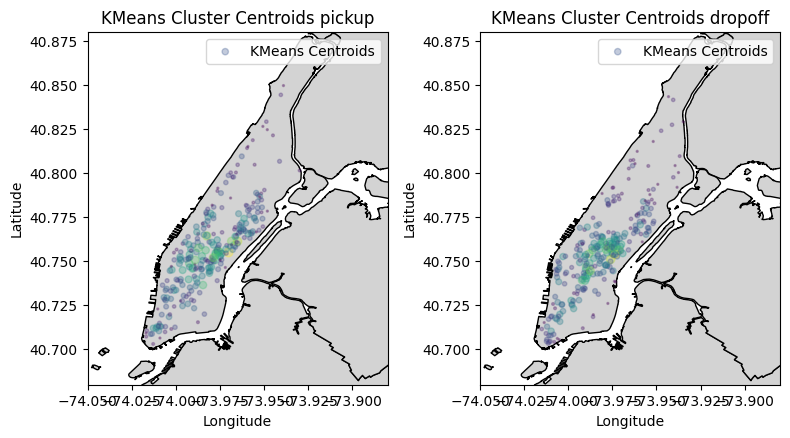

In [ ]:

# Plot KMeans centroids on the map with marker size based on cluster size
fig, ax2 = plt.subplots(1, 2, figsize=(8, 12)) #pickup and drop off
ax=ax2[0]
boroughs_latlon.plot(ax=ax, color='lightgrey', edgecolor='black')
# Plot the centroids with marker size based on cluster size and alpha
scatter = ax.scatter(cluster_summary['pickup_longitude'], cluster_summary['pickup_latitude'],
            s=cluster_summary['cluster_size']*2, # Use cluster size for marker size
            c=cluster_summary['cluster_size'], # Use cluster size for color
            cmap='viridis', # Specify a colormap
            alpha=0.3, label='KMeans Centroids', zorder=3)

ax.set_title('KMeans Cluster Centroids pickup')
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(-74.05,-73.88)
ax.set_ylim(40.68,40.88)
ax.set_aspect('equal', adjustable='box')
ax.legend(loc='upper right')

ax1=ax2[1]
boroughs_latlon.plot(ax=ax1, color='lightgrey', edgecolor='black')
# Plot the centroids with marker size based on cluster size and alpha
scatter = ax1.scatter(cluster_summary['dropoff_longitude'], cluster_summary['dropoff_latitude'],
            s=cluster_summary['cluster_size']*2, # Use cluster size for marker size
            c=cluster_summary['cluster_size'], # Use cluster size for color
            cmap='viridis', # Specify a colormap
            alpha=0.3, label='KMeans Centroids', zorder=3)

ax1.set_title('KMeans Cluster Centroids dropoff')
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_xlim(-74.05,-73.88)
ax1.set_ylim(40.68,40.88)
ax1.set_aspect('equal', adjustable='box')
ax1.legend(loc='upper right')

# Add a colorbar
#cbar = fig.colorbar(scatter, ax=ax1)
#cbar.set_label('Cluster Size')


plt.tight_layout()
plt.show()

In [ ]:
# draw a circle for each cluster at some center point
kmeans_cluster_circles=[]
for cluster_id in sorted(clustered_points_kmeans['kmeans_cluster'].unique()):
    cluster_data = clustered_points_kmeans[clustered_points_kmeans['kmeans_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    kmeans_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
kmeans_cluster_circles_df = pd.DataFrame(kmeans_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

In [ ]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_clusters if n_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))



for index, cluster in cluster_summary.iterrows():
    folium.CircleMarker(
        location=[cluster['pickup_longitude'], cluster['pickup_latitude']],
        radius=1,
        color='blue',
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster: {index}" # Add tooltip to show cluster ID on hover
    ).add_to(m)

for index,circle in kmeans_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



# plot the clustered points and the noise points
for index, row in clustered_points_kmeans.iterrows():
    cluster_id = row['kmeans_cluster']


    size= 0.3 if row['kmeans_valid'] == False else 1
    color = color_for_label(cluster_id) if row['kmeans_valid'] else 'gray'

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-299873553.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-299873553.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


In [ ]:
# We're going to use hdbscan as a starting point

#### Alternatively, try manually cutting it into 5 minute chunks and only do spatial clustering

In [ ]:
start_hh_mm='20:05'
end_hh_mm='20:10'
day_of_week='Monday'
start_time = pd.to_datetime('2013-06-03 '+start_hh_mm)
end_time = pd.to_datetime('2013-06-03 '+end_hh_mm)
rides_day=rides_df[rides_df['pickup_weekday']==day_of_week]

rides_daytime = rides_day[
    (rides_day['pickup_datetime'] >= start_time) &
    (rides_day['pickup_datetime'] < end_time)
]

# Sample up to 1000 points if there are more than 1000
sample_size = min(5000, len(rides_daytime))
sample_rides_shorter = rides_daytime.sample(n=sample_size, random_state=42) if sample_size > 0 else rides_daytime.copy()



print(f"Number of rides on {day_of_week}: {len(rides_day)}")
print(f"Number of rides found between {start_hh_mm} and {end_hh_mm} on {day_of_week}: {len(rides_daytime)}")
print(f"Number of rides selected for sample: {len(sample_rides_shorter)}")

Number of rides on Monday: 375304
Number of rides found between 20:05 and 20:10 on Monday: 1980
Number of rides selected for sample: 1980


In [ ]:
# We want to cluster based on pickup and drop off coordinates, and pickup time
#using the same cluster features for all 3 clustering methods
cluster_features_spatial=sample_rides_shorter[['pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude']]
scaler=StandardScaler()
scaled_features_spatial=scaler.fit_transform(cluster_features_spatial)

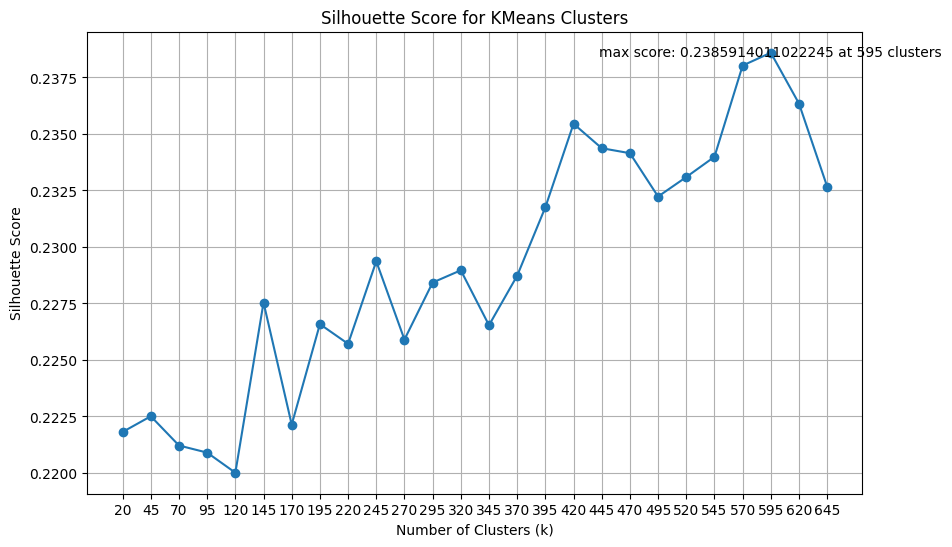

max score of silhouette score: 0.2385914011022245 at 595 clusters


In [ ]:


# Calculate silhouette score for a range of cluster numbers
silhouette_scores = []
n_samples=len(cluster_features_spatial)
k_range = range(20,n_samples//3,25)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=3)
    cluster_labels = kmeans.fit_predict(scaled_features_spatial)
    score = silhouette_score(scaled_features_spatial, cluster_labels)
    silhouette_scores.append(score)

max_score=max(silhouette_scores)
max_cnum=k_range[np.argmax(silhouette_scores)]

# Plot the elbow method graph
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o')
plt.title('Silhouette Score for KMeans Clusters')
plt.text(max_cnum, max_score, f"max score: {max_score} at {max_cnum} clusters", horizontalalignment='center',
     verticalalignment='center')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_range)
plt.grid(True)
plt.show()
print(f"max score of silhouette score: {max_score} at {max_cnum} clusters")

In [ ]:


n_clusters=max_cnum
kmeans_spatial = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
spatial_clusters = kmeans_spatial.fit_predict(scaled_features_spatial)

# Add cluster labels to the dataframe
sample_rides_shorter['spatial_kmeans_cluster'] = spatial_clusters

cluster_sizes =  sample_rides_shorter['spatial_kmeans_cluster'].value_counts()

#number of clusters with sizes more than 2
n_valid_clusters = len(cluster_sizes[cluster_sizes > 2])
n_valid_rides=sum(cluster_sizes[cluster_sizes>2])

print(f"Number of clusters with more than 2 rides: {n_valid_clusters} or {round(n_valid_clusters/n_clusters*100,2)}%")
print(f"Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/n_samples*100,2)}% rides")


Number of clusters with more than 2 rides: 357 or 60.0%
Number of rides successfully clustered: 1629 or 82.27% rides


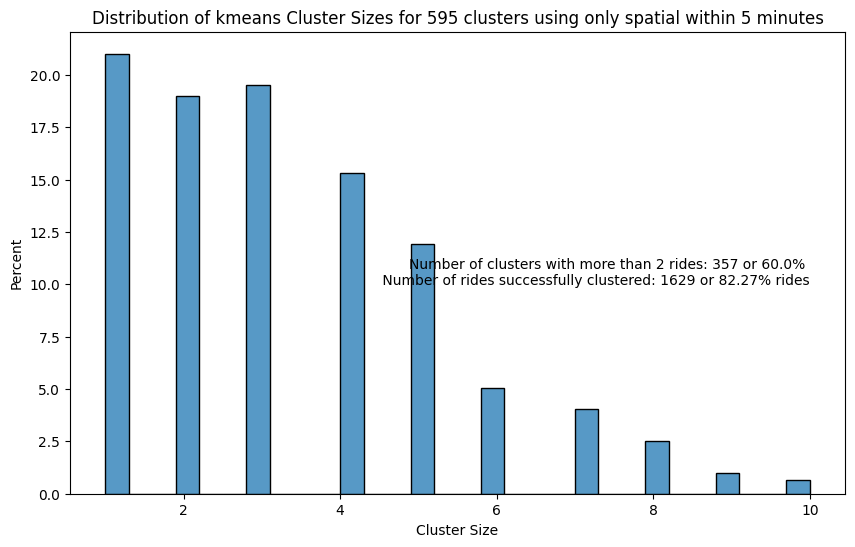

In [ ]:


# Plot a histogram of cluster sizes
plt.figure(figsize=(10, 6))
sns.histplot(cluster_sizes, bins=30, kde=False,stat='percent')
plt.title(f'Distribution of kmeans Cluster Sizes for {n_clusters} clusters using only spatial within 5 minutes')
plt.text(max(cluster_sizes), 10, f"Number of clusters with more than 2 rides: {n_valid_clusters} or {n_valid_clusters/n_clusters*100}% \n Number of rides successfully clustered: {n_valid_rides} or {round(n_valid_rides/n_samples*100,2)}% rides", horizontalalignment='right')
plt.xlabel('Cluster Size')
plt.ylabel('Percent')

plt.show()

In [ ]:
# draw a circle for each cluster at some center point
kmeans_spatial_cluster_circles=[]
for cluster_id in sorted(sample_rides_shorter['spatial_kmeans_cluster'].unique()):
    cluster_data = sample_rides_shorter[sample_rides_shorter['spatial_kmeans_cluster'] == cluster_id]
    lat_min, lon_min = cluster_data[['pickup_latitude', 'pickup_longitude']].min()
    lat_max, lon_max = cluster_data[['pickup_latitude', 'pickup_longitude']].max()
    center = [(lat_min + lat_max) / 2, (lon_min + lon_max) / 2]
    radius = haversine_distance(lat_min, lon_min, lat_max, lon_max)/2
    kmeans_spatial_cluster_circles.append((cluster_id,center,radius))


# Convert the list of tuples to a pandas DataFrame
kmeans_spatial_cluster_circles_df = pd.DataFrame(kmeans_spatial_cluster_circles, columns=['cluster_id', 'center', 'radius'])

#print(cluster_circles_df)

# Group by cluster and calculate the mean longitude, latitude, and count (size)
cluster_summary = sample_rides_shorter.groupby('spatial_kmeans_cluster').agg(
    pickup_longitude=('pickup_longitude', 'mean'),
    pickup_latitude=('pickup_latitude', 'mean'),
    dropoff_longitude=('dropoff_longitude', 'mean'),
    dropoff_latitude=('dropoff_latitude', 'mean'),
    cluster_size=('spatial_kmeans_cluster', 'count')
)

# Label valid clusters in cluster_summary
cluster_summary['is_valid'] = cluster_summary['cluster_size'] > 2

# Indicate a 'kmeans_valid' column in clustered_points_kmeans based on cluster_summary
sample_rides_shorter = sample_rides_shorter.merge(
    cluster_summary[['is_valid']], left_on='spatial_kmeans_cluster', right_index=True
)
sample_rides_shorter.rename(columns={'is_valid': 'kmeans_valid'}, inplace=True)
sample_rides_shorter.head()


,pickup_datetime,dropoff_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_time_in_secs,trip_distance,fare_amount,trip_time_in_mins,pickup_hour,pickup_weekday,pickup_numeric,spatial_kmeans_cluster,kmeans_valid
1150424,2013-06-03 20:09:41,2013-06-03 20:20:19,-74.012718,40.702522,-73.978378,40.745754,638,4.70,15.5,10.633333,20,Monday,12009,506,True
601514,2013-06-03 20:06:00,2013-06-03 20:12:00,-73.949219,40.777016,-73.941978,40.795280,360,1.59,7.0,6.000000,20,Monday,12006,137,True
614632,2013-06-03 20:07:00,2013-06-03 20:20:00,-73.970825,40.758667,-73.982803,40.723000,780,3.11,12.0,13.000000,20,Monday,12007,342,True
1855535,2013-06-03 20:05:01,2013-06-03 20:21:39,-73.977348,40.753300,-73.997215,40.719189,997,3.00,13.0,16.616667,20,Monday,12005,365,True
1859644,2013-06-03 20:07:09,2013-06-03 20:15:57,-73.981201,40.784145,-73.957741,40.774090,527,1.50,8.5,8.783333,20,Monday,12007,256,True


In [ ]:

# Compute center of map
# Use the mean of all points for centering, not just clustered points
mean_lat = np.mean(rides_sample['pickup_latitude'])
mean_lon = np.mean(rides_sample['pickup_longitude'])


m = folium.Map(location=[mean_lat, mean_lon], zoom_start=12)

# Function to get a unique color for each cluster
def color_for_label(label):
    cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
    # Normalize the cluster ID to the range [0, 1] for the colormap
    norm = matplotlib.colors.Normalize(vmin=0, vmax=n_valid_clusters if n_valid_clusters > 0 else 1)
    return matplotlib.colors.rgb2hex(cmap(norm(label)))


#plot cluster center
for index, cluster in cluster_summary.iterrows():
    color = color_for_label(index) if cluster['is_valid'] else 'gray'
    folium.CircleMarker(
        location=[cluster['pickup_longitude'], cluster['pickup_latitude']],
        radius=1,
        color=color,
        fill=True,
        fill_opacity=1,
        tooltip=f"Cluster center: {index}" # Add tooltip to show cluster ID on hover
    ).add_to(m)


for index,circle in kmeans_spatial_cluster_circles_df.iterrows():
    color = color_for_label(circle['cluster_id'])
    folium.Circle(
        location=circle['center'],
        radius=circle['radius'],
        weight=0.5,
        color=color,
        fill=True,
        fill_opacity=0.1,
        tooltip=f"Cluster Circle: {circle['cluster_id']}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



# plot the clustered points and the noise points
for index, row in sample_rides_shorter.iterrows():
    cluster_id = row['spatial_kmeans_cluster']


    size= 0.3 if row['kmeans_valid'] == False else 1
    color = color_for_label(cluster_id) if row['kmeans_valid'] else 'gray'

    folium.CircleMarker(
        location=[row['pickup_latitude'], row['pickup_longitude']],
        radius=size, # Adjust radius as needed
        color=color,
        fill=True,
        fill_opacity=0.7,
        tooltip=f"Cluster point: {cluster_id}" # Add tooltip to show cluster ID on hover
    ).add_to(m)



#m.save('/content/drive/MyDrive/Colab Notebooks/colab data/images/dbscan025.html')
display(m)

/tmp/ipython-input-2250027591.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)
/tmp/ipython-input-2250027591.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', n_clusters if n_clusters > 0 else 1)


In [ ]:
#can also look at some aggregated ride stats
cluster_averages = clustered_points_kmeans.groupby('kmeans_cluster').agg(
    average_pickup_longitude=('pickup_longitude', 'mean'),
    average_pickup_latitude=('pickup_latitude', 'mean'),
    average_dropoff_longitude=('dropoff_longitude', 'mean'),
    average_dropoff_latitude=('dropoff_latitude', 'mean'),
    average_pickup_numeric=('pickup_numeric', 'mean')
).sort_values(by='average_pickup_numeric', ascending=True)



print("Average characteristics for each cluster:")
#cluster_averages.to_csv('/content/drive/MyDrive/Colab Notebooks/colab data/cluster_averages.csv')
display(cluster_averages)

In [ ]:
# Probably wrap this into a function because the plotting and summaries are the same

## Optimisation

In [ ]:
#murder me thanks